# Appendix J - Supporting Python Code

## 1) Qualitative Approach To Vocabulary Selection

### 1.1) Loading the Corpus

First, we will load many of the Python packages that will be needed for our analysis.

In [1]:
# Import Libraries
import pandas as pd
import os
import numpy as np
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import random
from dataclasses import dataclass

from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer

import gensim
from gensim.models import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE

import scipy.cluster.hierarchy

from IPython.display import display, HTML

from typing import List, Callable, Dict

In [2]:
# NLTK Downloads
# Only run this cell once. At that point, the appropriate resources will be downloaded.
nltk.download('stopwords',quiet=True)
nltk.download('wordnet',quiet=True)
nltk.download('punkt',quiet=True)
nltk.download('omw-1.4',quiet=True)

True

Gensim is a Python library for topic modelling, document indexing and similarity retrieval with large corpora. Target audience is the natural language processing (NLP) and information retrieval (IR) community

https://pypi.org/project/gensim/

In [3]:
import pkg_resources

In [4]:
# Print Gensim Version
print("Genism Version: ", gensim.__version__)

Genism Version:  4.1.2


In [5]:
# Suppress Warning Messages
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

Now, we may load the corpus for our natural language processing project.

In [6]:
# Create Document class
@dataclass
class Document:
    doc_id: str
    text: str

# Create corpus dataframe
def add_movie_descriptor(data: pd.DataFrame, corpus_df: pd.DataFrame):
    """
    Adds "Movie Description" to the supplied dataframe, in the form {Genre}_{P|N}_{Movie Title}_{DocID}
    """
    review = np.where(corpus_df['Review Type (pos or neg)'] == 'Positive', 'P', 'N')
    data['Descriptor'] = corpus_df['Genre of Movie'] + '_' + corpus_df['Movie Title'] + '_' + review + '_' + corpus_df['Doc_ID'].astype(str)

def get_corpus_df(path):
    data = pd.read_csv(path, encoding="utf-8")
    add_movie_descriptor(data, data)
    sorted_data = data.sort_values(['Descriptor'])
    indexed_data = sorted_data.set_index(['Doc_ID'])
    indexed_data['Doc_ID'] = indexed_data.index
    return indexed_data

# Define documents in this new class
corpus_df = get_corpus_df('MSDS453_ClassCorpus_Final_Sec56_v4_20230702.csv')
documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

### 1.2) Exploratory Data Analysis

Having imported the corpus of movie reviews, let's conduct exploratory data analysis on the raw dataset.

In [7]:
corpus_df.shape

(190, 9)

In [8]:
corpus_df.head(4).T

Doc_ID,101,102,103,104
DSI_Title,SAR_Doc1_Covenant,SAR_Doc2_Covenant,SAR_Doc3_Covenant,SAR_Doc4_Covenant
Submission File Name,SAR_Doc1_Covenant,SAR_Doc2_Covenant,SAR_Doc3_Covenant,SAR_Doc4_Covenant
Student Name,SAR,SAR,SAR,SAR
Genre of Movie,Action,Action,Action,Action
Review Type (pos or neg),Negative,Negative,Negative,Negative
Movie Title,Covenant,Covenant,Covenant,Covenant
Text,Nearly two years after the American military w...,Have Guy Ritchie and Jake Gyllenhaal switched ...,Guy Ritchie's The Covenant notably marks the f...,"In a weird throwback to those Chuck Norris ""Mi..."
Descriptor,Action_Covenant_N_101,Action_Covenant_N_102,Action_Covenant_N_103,Action_Covenant_N_104
Doc_ID,101,102,103,104


In [9]:
print(corpus_df.info());

<class 'pandas.core.frame.DataFrame'>
Int64Index: 190 entries, 101 to 217
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   DSI_Title                 190 non-null    object
 1   Submission File Name      190 non-null    object
 2   Student Name              190 non-null    object
 3   Genre of Movie            190 non-null    object
 4   Review Type (pos or neg)  190 non-null    object
 5   Movie Title               190 non-null    object
 6   Text                      190 non-null    object
 7   Descriptor                190 non-null    object
 8   Doc_ID                    190 non-null    int64 
dtypes: int64(1), object(8)
memory usage: 14.8+ KB
None


In [10]:
print(corpus_df['Movie Title'].unique())

['Covenant' 'Inception' 'No time to die' 'Taken' 'The Dark Knight Rises'
 'Despicable Me 3' 'Holmes and Watson' 'Legally Blonde' 'Lost City'
 'Sisters' 'Drag Me to Hell' 'Fresh' 'It Chapter Two' 'The Toxic Avenger'
 'US' 'Annihilation' 'Minority Report' 'Oblivion' 'Pitch Black']


In [11]:
# Gather the number of reviews by genre
counts_df = corpus_df[['Genre of Movie']].copy()
counts_df['Count'] = 1
counts_df.groupby(['Genre of Movie']).count().reset_index()

,Genre of Movie,Count
0,Action,50
1,Comedy,50
2,Horror,50
3,Sci-Fi,40


In [12]:
corpus_df.columns

Index(['DSI_Title', 'Submission File Name', 'Student Name', 'Genre of Movie',
       'Review Type (pos or neg)', 'Movie Title', 'Text', 'Descriptor',
       'Doc_ID'],
      dtype='object')

### 1.3) Normalization and Tokenization

Let's conduct normalization of our movie review corpus by removing punctuation transforming text to lowercase, removing HTML tags.

In [13]:
def remove_punctuation(text):
    return re.sub('[^a-zA-Z]', ' ', str(text))

def lower_case(text):
    return text.lower()    

def remove_tags(text):    
    return re.sub("&lt;/?.*?&gt;"," &lt;&gt; ", text)

def normalize_document(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    
    return Document(document.doc_id, text)

def normalize_documents(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document(x) for x in documents]

normalized_documents = normalize_documents(documents)
normalized_documents[0]

Document(doc_id=101, text='nearly two years after the american military withdrew from afghanistan  ending the longest war in u s  history  it should come as no surprise that filmmakers are starting to look back and ask   what just happened   that s what artists do  after all  they examine the world around them  that guy ritchie is one of them in this case  however   that might be a surprise  heretofore  ritchie has for the most part been one of the fun ones  building his name on stylish action  well timed one liners and heavier than a lead zeppelin british accents  substance  nah  guv  no need  but in his latest  the war drama  the covenant   starring jake gyllenhaal and set during the war in afghanistan  he s got something to say  this is serious guy ritchie  this is thoughtful guy ritchie  this is earnest guy ritchie  if only profound guy ritchie had come along for the trip  we might be onto something special  instead  we get a capably made but simple minded rescue film  one with a b

Let's tokenize the movie review corpus to divide the documents from strings into lists of substrings.

In [14]:
@dataclass
class TokenizedDocument:
    doc_id: str
    tokens: List[str]

def tokenize_document(document: Document) -> TokenizedDocument:
    tokens = nltk.word_tokenize(document.text)
    return TokenizedDocument(document.doc_id, tokens)

def tokenize_documents(documents: List[Document]) -> List[TokenizedDocument]:
    return [tokenize_document(x) for x in documents]

tokenized_documents = tokenize_documents(normalized_documents)
tokenized_documents[0]

TokenizedDocument(doc_id=101, tokens=['nearly', 'two', 'years', 'after', 'the', 'american', 'military', 'withdrew', 'from', 'afghanistan', 'ending', 'the', 'longest', 'war', 'in', 'u', 's', 'history', 'it', 'should', 'come', 'as', 'no', 'surprise', 'that', 'filmmakers', 'are', 'starting', 'to', 'look', 'back', 'and', 'ask', 'what', 'just', 'happened', 'that', 's', 'what', 'artists', 'do', 'after', 'all', 'they', 'examine', 'the', 'world', 'around', 'them', 'that', 'guy', 'ritchie', 'is', 'one', 'of', 'them', 'in', 'this', 'case', 'however', 'that', 'might', 'be', 'a', 'surprise', 'heretofore', 'ritchie', 'has', 'for', 'the', 'most', 'part', 'been', 'one', 'of', 'the', 'fun', 'ones', 'building', 'his', 'name', 'on', 'stylish', 'action', 'well', 'timed', 'one', 'liners', 'and', 'heavier', 'than', 'a', 'lead', 'zeppelin', 'british', 'accents', 'substance', 'nah', 'guv', 'no', 'need', 'but', 'in', 'his', 'latest', 'the', 'war', 'drama', 'the', 'covenant', 'starring', 'jake', 'gyllenhaal', 

### 1.4) Definition of Useful Lookups

In [15]:
#index(['Doc_ID', 'DSI_Title', 'Submission File Name', 'Student Name',
#       'Genre of Movie', 'Review Type (pos or neg)', 'Movie Title', 'Text'],
#      dtype='object')

In [16]:
titles_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Movie Title'])}
genres_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Genre of Movie'])}
descriptors_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Descriptor'])}

comedy_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] == 'Comedy']
comedy_documents = [x for x in documents if x.doc_id in comedy_doc_ids]

non_comedy_doc_ids = {int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] != 'Comedy'}
non_comedy_documents = [x for x in documents if x.doc_id in non_comedy_doc_ids]

In [17]:
print(corpus_df['Movie Title'].unique())

['Covenant' 'Inception' 'No time to die' 'Taken' 'The Dark Knight Rises'
 'Despicable Me 3' 'Holmes and Watson' 'Legally Blonde' 'Lost City'
 'Sisters' 'Drag Me to Hell' 'Fresh' 'It Chapter Two' 'The Toxic Avenger'
 'US' 'Annihilation' 'Minority Report' 'Oblivion' 'Pitch Black']


In [18]:
sisters_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if titles_by_doc_ids[x] == 'Sisters']
sisters_documents = [x for x in documents if x.doc_id in sisters_doc_ids]

### 1.5) Qualitative Term Determinations

Let's define some terms that we believe will be useful for grouping "Sisters" with other comedy movies prior to our more formal analysis leveraging the actual corpus.

In [19]:
candidate_terms = [
    'character',
    'comedy',
    'family',
    'funny',
    'friend',
    'humor',
    'joke',
    'laugh',
    'love',
    'party',
    'script',
    'school',
    'smile'
]

### 1.6) CountVectorizer

Convert a collection of text documents to a matrix of token counts.
This implementation produces a sparse representation of the counts using scipy.sparse.csr_matrix.
If you do not provide an a-priori dictionary and you do not use an analyzer that does some kind of feature selection then the number of features will be equal to the vocabulary size found by analyzing the data.

In [20]:
vectorizer = CountVectorizer(ngram_range=(1, 1))
text_for_counts = [x.text for x in normalized_documents]
matrix = vectorizer.fit_transform(text_for_counts)
words = vectorizer.get_feature_names_out()
word_counts = pd.DataFrame(matrix.toarray(), columns=words, index=corpus_df.Doc_ID)

In [21]:
def add_flags(data: pd.DataFrame, sisters_doc_ids: List[int], comedy_doc_ids: List[int]):
    data['is_sisters'] = data.index.isin(sisters_doc_ids)
    data['is_comedy'] = data.index.isin(comedy_doc_ids)

add_flags(word_counts, sisters_doc_ids, comedy_doc_ids)

word_counts['Doc_ID'] = word_counts.index

In [22]:
# Collect result into a dataframe
mean_frequencies = pd.DataFrame(index=candidate_terms)

sisters_mean_frequencies = word_counts[word_counts.is_sisters][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['Sisters'] = sisters_mean_frequencies

comedy_mean_frequencies = word_counts[word_counts.is_comedy][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Comedy'] = comedy_mean_frequencies

non_comedy_mean_frequencies = word_counts[~word_counts.is_comedy][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Non-Comedy'] = non_comedy_mean_frequencies

In [23]:
mean_frequencies.fillna(0.0).sort_values(['Sisters'], ascending=False)

,Sisters,All Comedy,All Non-Comedy
party,2.4,0.54,0.057143
comedy,1.4,1.08,0.214286
funny,0.8,0.50,0.135714
character,0.6,0.56,0.485714
family,0.6,0.58,0.321429
joke,0.6,0.38,0.050000
humor,0.5,0.32,0.078571
friend,0.4,0.12,0.128571
love,0.3,0.26,0.242857
script,0.3,0.16,0.150000


In [24]:
important_prevalent_terms = [
    'party',
    'comedy',
    'funny',
    'joke'
]
stemmer = PorterStemmer()
stemmed_important_prevalent_terms = [stemmer.stem(x) for x in important_prevalent_terms]


lemmatizer = WordNetLemmatizer()
lemmatized_important_prevalent_terms = [lemmatizer.lemmatize(x) for x in important_prevalent_terms]



In [25]:
pd.options.display.float_format = '{:,.2f}'.format
mean_frequencies.fillna(0.0).loc[important_prevalent_terms].round(2).sort_values(['Sisters'], ascending=False)

,Sisters,All Comedy,All Non-Comedy
party,2.40,0.54,0.06
comedy,1.40,1.08,0.21
funny,0.80,0.50,0.14
joke,0.60,0.38,0.05


## 2) Quantitative Approach To Vocabulary Selection

### 2.1) Data Wrangling 

#### 2.1.1) Data Wrangling - Method 1

Let's complete our first methodology for data wrangling.  Our first methodology will include normalization (including removing punctuation, converting capital letters into lowercase letters, removing HTML tags, and stemming), and tokenization.

In [26]:
# Normalization

def normalize_document_method_one(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    
    return Document(document.doc_id, text)

def normalize_documents_method_one(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, and removes tags.
    """
    return [normalize_document_method_one(x) for x in documents]

normalized_documents_method_one = normalize_documents_method_one(documents)
normalized_documents_method_one[0]

Document(doc_id=101, text='nearly two years after the american military withdrew from afghanistan  ending the longest war in u s  history  it should come as no surprise that filmmakers are starting to look back and ask   what just happened   that s what artists do  after all  they examine the world around them  that guy ritchie is one of them in this case  however   that might be a surprise  heretofore  ritchie has for the most part been one of the fun ones  building his name on stylish action  well timed one liners and heavier than a lead zeppelin british accents  substance  nah  guv  no need  but in his latest  the war drama  the covenant   starring jake gyllenhaal and set during the war in afghanistan  he s got something to say  this is serious guy ritchie  this is thoughtful guy ritchie  this is earnest guy ritchie  if only profound guy ritchie had come along for the trip  we might be onto something special  instead  we get a capably made but simple minded rescue film  one with a b

In [27]:
# Tokenization
tokenized_documents_method_one = tokenize_documents(normalized_documents_method_one)
tokenized_documents_method_one[0]

TokenizedDocument(doc_id=101, tokens=['nearly', 'two', 'years', 'after', 'the', 'american', 'military', 'withdrew', 'from', 'afghanistan', 'ending', 'the', 'longest', 'war', 'in', 'u', 's', 'history', 'it', 'should', 'come', 'as', 'no', 'surprise', 'that', 'filmmakers', 'are', 'starting', 'to', 'look', 'back', 'and', 'ask', 'what', 'just', 'happened', 'that', 's', 'what', 'artists', 'do', 'after', 'all', 'they', 'examine', 'the', 'world', 'around', 'them', 'that', 'guy', 'ritchie', 'is', 'one', 'of', 'them', 'in', 'this', 'case', 'however', 'that', 'might', 'be', 'a', 'surprise', 'heretofore', 'ritchie', 'has', 'for', 'the', 'most', 'part', 'been', 'one', 'of', 'the', 'fun', 'ones', 'building', 'his', 'name', 'on', 'stylish', 'action', 'well', 'timed', 'one', 'liners', 'and', 'heavier', 'than', 'a', 'lead', 'zeppelin', 'british', 'accents', 'substance', 'nah', 'guv', 'no', 'need', 'but', 'in', 'his', 'latest', 'the', 'war', 'drama', 'the', 'covenant', 'starring', 'jake', 'gyllenhaal', 

In [28]:

# Stemming
def stem(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    stemmer = PorterStemmer()
    for document in documents:
        output_tokens = [stemmer.stem(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

tokenized_documents_method_one = stem(tokenized_documents_method_one)

#### 2.1.2) Data Wrangling - Method 2

Let's complete our second methodology for data wrangling. Like the first methodology, this methodology will also include normalization (including removing punctuation, converting capital letters into lowercase letters, and removing HTML tags) and tokenization.  However, this methodology will differ because we will remove common stop words and will leverage lemmatization instead of stemming.

In [29]:
# Normalization

def remove_special_chars_and_digits(text):
    return re.sub("(\\d|\\W)+"," ", text)

def normalize_document_method_two(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    text = remove_special_chars_and_digits(text)
    
    return Document(document.doc_id, text)

def normalize_documents_method_two(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document_method_two(x) for x in documents]

normalized_documents_method_two = normalize_documents_method_two(documents)
normalized_documents_method_two[0]

Document(doc_id=101, text='nearly two years after the american military withdrew from afghanistan ending the longest war in u s history it should come as no surprise that filmmakers are starting to look back and ask what just happened that s what artists do after all they examine the world around them that guy ritchie is one of them in this case however that might be a surprise heretofore ritchie has for the most part been one of the fun ones building his name on stylish action well timed one liners and heavier than a lead zeppelin british accents substance nah guv no need but in his latest the war drama the covenant starring jake gyllenhaal and set during the war in afghanistan he s got something to say this is serious guy ritchie this is thoughtful guy ritchie this is earnest guy ritchie if only profound guy ritchie had come along for the trip we might be onto something special instead we get a capably made but simple minded rescue film one with a big heart even if it could have used

In [30]:
# Tokenization

tokenized_documents_method_two = tokenize_documents(normalized_documents_method_two)
tokenized_documents_method_two[0]

TokenizedDocument(doc_id=101, tokens=['nearly', 'two', 'years', 'after', 'the', 'american', 'military', 'withdrew', 'from', 'afghanistan', 'ending', 'the', 'longest', 'war', 'in', 'u', 's', 'history', 'it', 'should', 'come', 'as', 'no', 'surprise', 'that', 'filmmakers', 'are', 'starting', 'to', 'look', 'back', 'and', 'ask', 'what', 'just', 'happened', 'that', 's', 'what', 'artists', 'do', 'after', 'all', 'they', 'examine', 'the', 'world', 'around', 'them', 'that', 'guy', 'ritchie', 'is', 'one', 'of', 'them', 'in', 'this', 'case', 'however', 'that', 'might', 'be', 'a', 'surprise', 'heretofore', 'ritchie', 'has', 'for', 'the', 'most', 'part', 'been', 'one', 'of', 'the', 'fun', 'ones', 'building', 'his', 'name', 'on', 'stylish', 'action', 'well', 'timed', 'one', 'liners', 'and', 'heavier', 'than', 'a', 'lead', 'zeppelin', 'british', 'accents', 'substance', 'nah', 'guv', 'no', 'need', 'but', 'in', 'his', 'latest', 'the', 'war', 'drama', 'the', 'covenant', 'starring', 'jake', 'gyllenhaal', 

In [31]:
# Lemmatization

def lemmatize(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    lemmatizer = WordNetLemmatizer()
    for document in documents:
        output_tokens = [lemmatizer.lemmatize(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))
        
    return result

tokenized_documents_method_two = lemmatize(tokenized_documents_method_two)

In [32]:
# Stop Words Elimination

def remove_stop_words(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    
    stop_words = set(nltk.corpus.stopwords.words('english')) 
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in stop_words]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))
        
    return result

tokenized_documents_method_two = remove_stop_words(tokenized_documents_method_two)

#### 2.1.3) Data Wrangling - Method 3

Let's complete our third methodology for data wrangling. This third methodology will be very similar to the second methodology for normalization and tokenization, except in addition, this methodology will also involve removing special characters and digits and removing custom stop words that may not be helpful for our particular NLP pipeline that will be focused on clustering movie reviews by movie genre.

In [33]:
# Normalization

def normalize_document_method_three(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    text = remove_special_chars_and_digits(text)
    
    return Document(document.doc_id, text)

def normalize_documents_method_three(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document_method_three(x) for x in documents]

normalized_documents_method_three = normalize_documents_method_three(documents)
normalized_documents_method_three[0]

Document(doc_id=101, text='nearly two years after the american military withdrew from afghanistan ending the longest war in u s history it should come as no surprise that filmmakers are starting to look back and ask what just happened that s what artists do after all they examine the world around them that guy ritchie is one of them in this case however that might be a surprise heretofore ritchie has for the most part been one of the fun ones building his name on stylish action well timed one liners and heavier than a lead zeppelin british accents substance nah guv no need but in his latest the war drama the covenant starring jake gyllenhaal and set during the war in afghanistan he s got something to say this is serious guy ritchie this is thoughtful guy ritchie this is earnest guy ritchie if only profound guy ritchie had come along for the trip we might be onto something special instead we get a capably made but simple minded rescue film one with a big heart even if it could have used

In [34]:
# Tokenization

tokenized_documents_method_three = tokenize_documents(normalized_documents_method_three)
tokenized_documents_method_three[0]

TokenizedDocument(doc_id=101, tokens=['nearly', 'two', 'years', 'after', 'the', 'american', 'military', 'withdrew', 'from', 'afghanistan', 'ending', 'the', 'longest', 'war', 'in', 'u', 's', 'history', 'it', 'should', 'come', 'as', 'no', 'surprise', 'that', 'filmmakers', 'are', 'starting', 'to', 'look', 'back', 'and', 'ask', 'what', 'just', 'happened', 'that', 's', 'what', 'artists', 'do', 'after', 'all', 'they', 'examine', 'the', 'world', 'around', 'them', 'that', 'guy', 'ritchie', 'is', 'one', 'of', 'them', 'in', 'this', 'case', 'however', 'that', 'might', 'be', 'a', 'surprise', 'heretofore', 'ritchie', 'has', 'for', 'the', 'most', 'part', 'been', 'one', 'of', 'the', 'fun', 'ones', 'building', 'his', 'name', 'on', 'stylish', 'action', 'well', 'timed', 'one', 'liners', 'and', 'heavier', 'than', 'a', 'lead', 'zeppelin', 'british', 'accents', 'substance', 'nah', 'guv', 'no', 'need', 'but', 'in', 'his', 'latest', 'the', 'war', 'drama', 'the', 'covenant', 'starring', 'jake', 'gyllenhaal', 

In [35]:
# Lemmatization

tokenized_documents_method_three = lemmatize(tokenized_documents_method_three)

In [36]:
# Stop Words Elimination

tokenized_documents_method_three = remove_stop_words(tokenized_documents_method_three)

In [37]:
# Removal of Custom Stop Words

def remove_custom_stop_words(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    
    custom_stop_words = set(['film', 'movie', 'ha', 'wa', 'get', 'make', 'also', 'much', 'way', 'scene', 'thing', 'would', 'come', 'man', 'say', 'really', 'human', 'audience', 'many', 'made', 'still'  ]) 
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in custom_stop_words]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))
        
    return result

tokenized_documents_method_three = remove_custom_stop_words(tokenized_documents_method_three)
tokenized_documents_method_three[0]

TokenizedDocument(doc_id=101, tokens=['nearly', 'two', 'year', 'american', 'military', 'withdrew', 'afghanistan', 'ending', 'longest', 'war', 'u', 'history', 'surprise', 'filmmaker', 'starting', 'look', 'back', 'ask', 'happened', 'artist', 'examine', 'world', 'around', 'guy', 'ritchie', 'one', 'case', 'however', 'might', 'surprise', 'heretofore', 'ritchie', 'part', 'one', 'fun', 'one', 'building', 'name', 'stylish', 'action', 'well', 'timed', 'one', 'liner', 'heavier', 'lead', 'zeppelin', 'british', 'accent', 'substance', 'nah', 'guv', 'need', 'latest', 'war', 'drama', 'covenant', 'starring', 'jake', 'gyllenhaal', 'set', 'war', 'afghanistan', 'got', 'something', 'serious', 'guy', 'ritchie', 'thoughtful', 'guy', 'ritchie', 'earnest', 'guy', 'ritchie', 'profound', 'guy', 'ritchie', 'along', 'trip', 'might', 'onto', 'something', 'special', 'instead', 'capably', 'simple', 'minded', 'rescue', 'one', 'big', 'heart', 'even', 'could', 'used', 'brain', 'like', 'ritchie', 'message', 'straightfor

### 2.2) Document Vectorization Using TF-IDF

#### 2.2.1) Definition of Functions for TF-IDF Experiments

For each data wrangling methodologies, let's run some experiments.  To set up these experiments, we can obtain the Term Frequency - Inverse Document Frequency (TF-IDF) values associated with each token in each document. Subsequently, we can find the mean TF-IDF score associated with each of the terms that we had previously identified for potential inclusion in the corpus vocabulary. We can also find the terms that have the highest TF-IDF scores in our vocabulary, as well as their associated TF-IDF scores. Last, we can create a heatmap that visualizes the cosine similarity measures between each of the corpus documents using this TF-IDF vectorization method.

In this subsection, we first define the functions that will be used to conduct the experiments described above.

In [38]:
def run_tfidf(documents: List[Document],
#              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              modified_important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True):
#    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in documents]
    
    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 1),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])\
                                        .sort_values(by='score', ascending=False)\
                                        .reset_index(drop=True)

            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')
    
    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # Create document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix, 
                               columns=vectorizer.get_feature_names_out(), 
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, sisters_doc_ids, comedy_doc_ids)
    
    # Print the top 10 mean TF-IDF values
#    with pd.option_context("display.max_rows",100):
#        top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
#        top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
#        display(top10_tfidf)
        
    top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
    top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(top10_tfidf)
        
    
    # Define the top 96 terms in terms of TF-IDF for each data wrangling method for use later during
    # the Word2Vec experiments
    
    top96_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(96))
    top96_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
 
    if documents == tokenized_documents_method_one:
        global top_96_tfidf_terms_method_one_list
        top_96_tfidf_terms_method_one_list = top96_tfidf.index.tolist()

        
    elif documents == tokenized_documents_method_two:
        global top_96_tfidf_terms_method_two_list
        top_96_tfidf_terms_method_two_list = top96_tfidf.index.tolist()

        
    else:
        global top_96_tfidf_terms_method_three_list
        top_96_tfidf_terms_method_three_list = top96_tfidf.index.tolist()

        
    # Collect result into a dataframe
    tfidf_results = pd.DataFrame(index=important_prevalent_terms)
 
    impt_tfidf_results = doc_term_df[[x for x in modified_important_prevalent_terms if x in doc_term_df.columns]].mean().round(2)
    tfidf_results['Important Movies'] = impt_tfidf_results    
    impt_tfidf_results_df = impt_tfidf_results.to_frame()
    impt_tfidf_results_df.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(impt_tfidf_results_df)
    
    
    
    
    # Print the vocabulary size and heatmap
    plt.hist(doc_term_df.mean(), 100, range=(0, 8))
    
    print(f'Vocabulary size: {doc_term_df.shape[1]}')
    
    descriptors = corpus_df['Descriptor']
       
#    similarities = cosine_similarity(doc_term_df.loc[comedy_doc_ids], doc_term_df.loc[comedy_doc_ids])
    similarities = cosine_similarity(doc_term_df, doc_term_df)
    fig, ax = plt.subplots(figsize=(30, 30))
    labels = [descriptors_by_doc_ids[x.doc_id] for x in documents]
    sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
    #plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
    plt.show()

#### 2.2.2) TF-IDF Experiment Output - Data Wrangling Method 1

Let's run our TF-IDF experiments using the documents produced from processing the corpus data using data wrangling method one.

,Mean TF-IDF
the,27.83
and,14.54
of,13.23
to,12.47
in,8.55
is,7.71
it,7.67
that,6.31
as,4.51
with,4.45


,Mean TF-IDF
parti,0.73
comedi,1.12
funni,0.65
joke,0.85


Vocabulary size: 8277


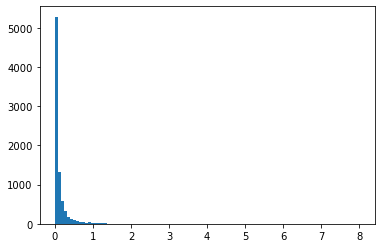

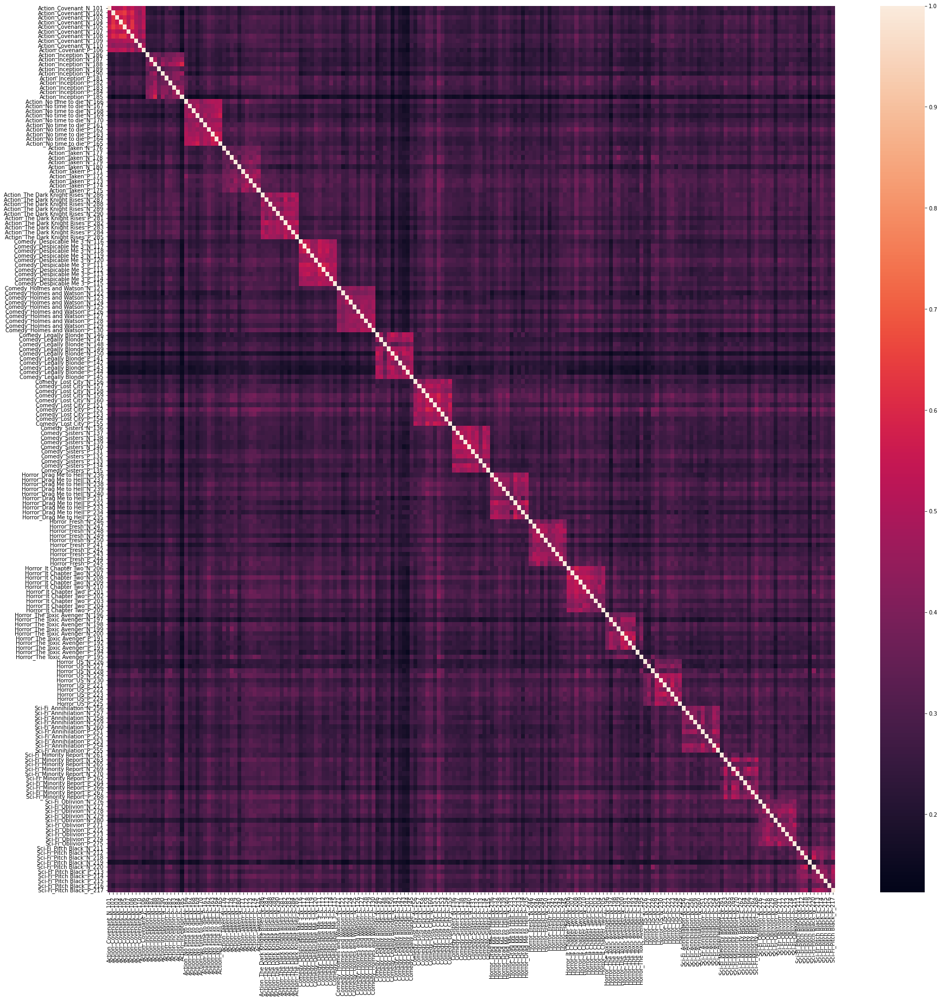

In [39]:
run_tfidf(tokenized_documents_method_one, important_prevalent_terms, stemmed_important_prevalent_terms,
          'TF_IDF_Experiment_Method_1')


#### 2.2.3) TF-IDF Experiment Output - Data Wrangling Method 2

Let's run our TF-IDF experiments using the documents produced from processing the corpus data using data wrangling method two.

,Mean TF-IDF
film,3.56
movie,2.98
ha,2.39
wa,2.29
one,2.18
like,2.14
bond,2.01
get,1.78
time,1.68
two,1.58


,Mean TF-IDF
party,0.68
comedy,1.12
funny,0.65
joke,0.83


Vocabulary size: 10558


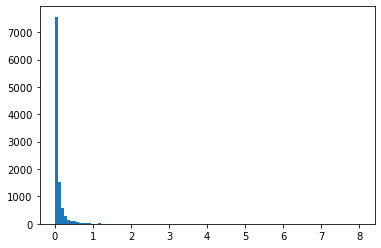

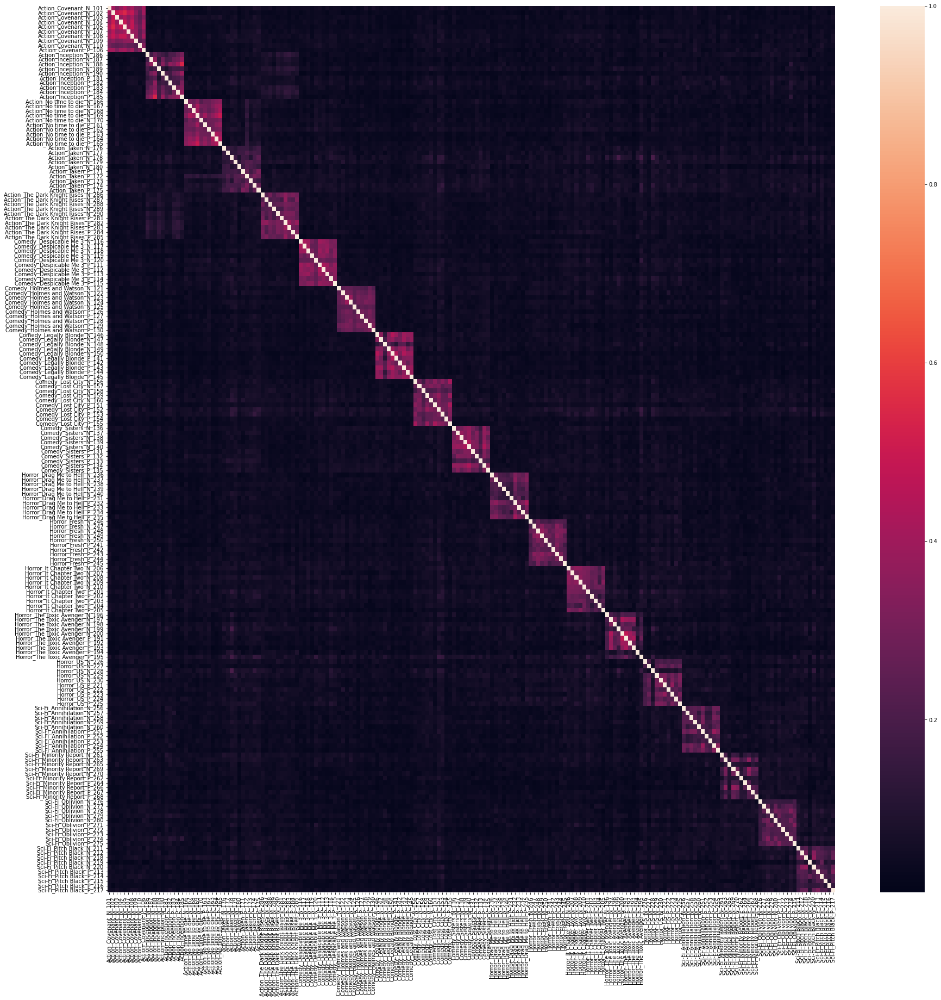

In [40]:
#run_tfidf(documents, clean_method, important_prevalent_terms, 'TFIDF_exp')

run_tfidf(tokenized_documents_method_two, important_prevalent_terms, lemmatized_important_prevalent_terms, 
          'TF_IDF_Experiment_Method_2')

#### 2.2.4) TF-IDF Experiment Output - Data Wrangling Method 3

Let's run our TF-IDF experiments using the documents produced from processing the corpus data using data wrangling method three.

,Mean TF-IDF
one,2.18
like,2.14
bond,2.01
time,1.68
two,1.58
character,1.58
dream,1.53
horror,1.44
even,1.39
first,1.36


,Mean TF-IDF
party,0.68
comedy,1.12
funny,0.65
joke,0.83


Vocabulary size: 10537


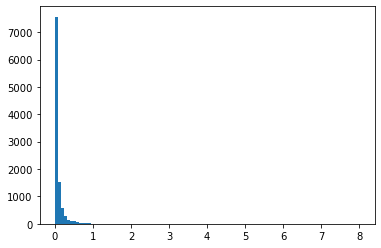

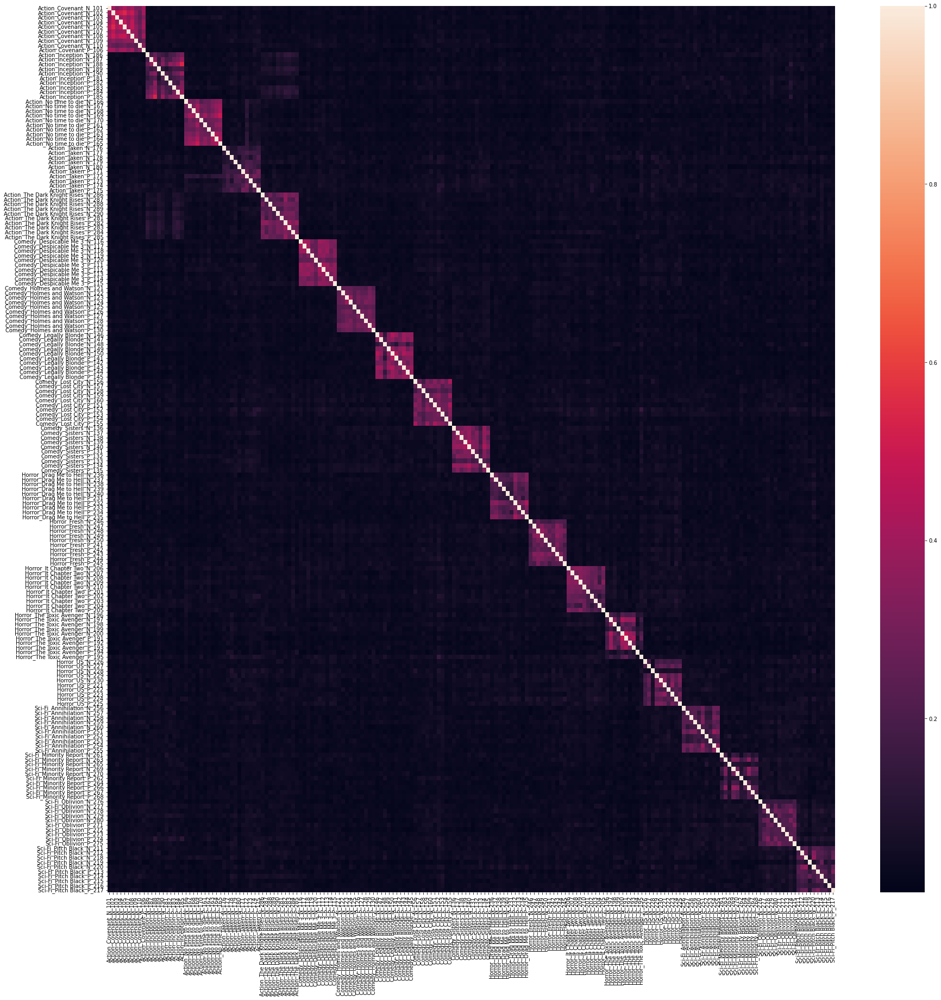

In [41]:
run_tfidf(tokenized_documents_method_three, important_prevalent_terms, lemmatized_important_prevalent_terms, 
          'TF_IDF_Experiment_Method_3')

### 2.3) Document Vectorization Using Doc2Vec

#### 2.3.1) Definition of Utility Functions for Doc2Vec Experiments

Let's define functions that can be leveraged to conduct experiments that transform the normalized and tokenized movie reviews into document embedding vectors via Doc2Vec.  Using these functions, we can plot heat maps of the cosine similarities of the document embedding vectors, as well as T-SNE plots of the document embedding vectors. These resources can help us identify which NLP data wrangling methods seem to be most effective at producing Doc2Vec embedding vectors that are best for grouping reviews of similar movies together.

In [42]:
def plot_similarity_matrix(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(ax=ax, data=similarities, xticklabels=data.index, yticklabels=data.index);
    #plt.savefig(f'figures/{experiment_name}_heatmap.png')
    plt.close()
    
def plot_similarity_clustermap(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    cm = sns.clustermap(similarities, metric='cosine', xticklabels=data.index, yticklabels=data.index, method='complete', cmap='RdBu', figsize=figsize)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    plt.legend(loc='upper left')
    #plt.savefig(f'figures/{experiment_name}_clustermap.png')
    plt.show()
    plt.close()

def plot_tsne(data: pd.DataFrame, perplexity: int, experiment_name: str, figsize=(40, 40)):
    """
    Creates a TSNE plot of the supplied dataframe
    """
    tsne_model = TSNE(perplexity=perplexity, n_components=2, learning_rate='auto', init='pca', n_iter=1000, random_state=32)
    new_values = tsne_model.fit_transform(data)
    
    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=figsize)
    labels = list(data.index)
    for i in range(len(x)):
        new_value = new_values[i]
        x = new_value[0]
        y = new_value[1]
        
        plt.scatter(x, y)
        plt.annotate(labels[i],
                     xy=(x, y),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    #plt.savefig(f'figures/{experiment_name}_tsne.png')
    plt.show()
    plt.close()
    
def run_doc2vec(documents: List[TokenizedDocument], embedding_size: int, descriptors_by_doc_ids: Dict[int, str]):
    tagged_documents = [TaggedDocument(document.tokens, [i]) for i, document in enumerate(documents)]
    doc2vec_model = Doc2Vec(tagged_documents, vector_size=embedding_size, window=3, min_count=2, workers=12)    
    
    doc2vec_df = pd.DataFrame()
    for document in documents:
        vector = pd.DataFrame(doc2vec_model.infer_vector(document.tokens)).transpose()
        doc2vec_df = pd.concat([doc2vec_df, vector], axis=0)
    
    doc2vec_df['Descriptor'] = [descriptors_by_doc_ids[x.doc_id] for x in documents]
    doc2vec_df.set_index(['Descriptor'], inplace=True)
    return doc2vec_df

def run_doc2vec_experiment(documents: List[Document],
#                           clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                           embedding_size: int,
                           experiment_name: str):
#    cleaned_documents = clean_func(documents)
#    doc2vec_df = run_doc2vec(cleaned_documents, embedding_size, descriptors_by_doc_ids)
    doc2vec_df = run_doc2vec(documents, embedding_size, descriptors_by_doc_ids)
    
    plot_similarity_matrix(doc2vec_df, experiment_name)
    plot_similarity_clustermap(doc2vec_df, experiment_name, figsize=(50, 50))
    plot_tsne(doc2vec_df, 30, experiment_name)

#### 2.3.2) Doc2Vec Experiment Outputs - T-SNE Plots and Heatmaps

Let's run our Doc2Vec experimentation function for each of the nine test cases of interest.  These nine experiments will leverage each of our three data wrangling methodologies.  For each of the data wrangling methods, we will run three experiments that use 100, 200, and 300 Doc2Vec embedding dimensions, respectively, to represent the corpus documents.

Doc2Vec Experiment 1 - Data Wrangling Method 1 - 100 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


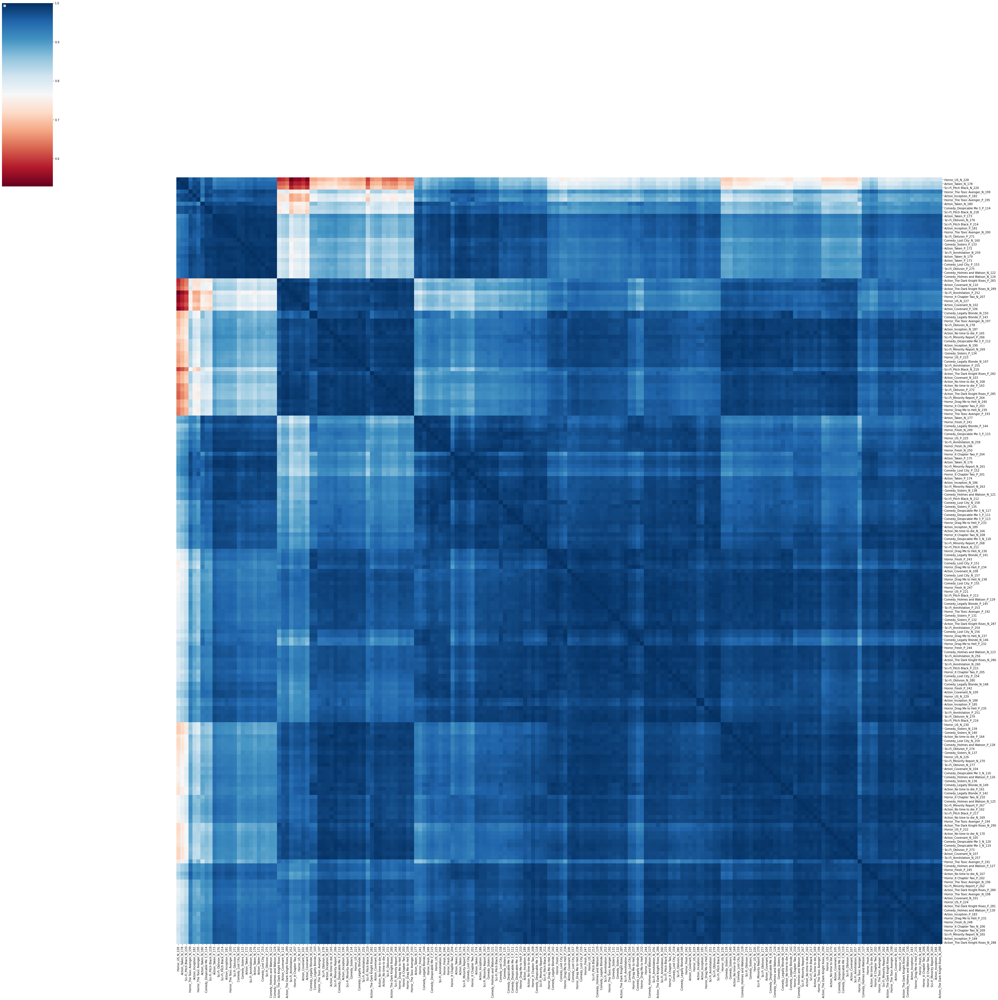

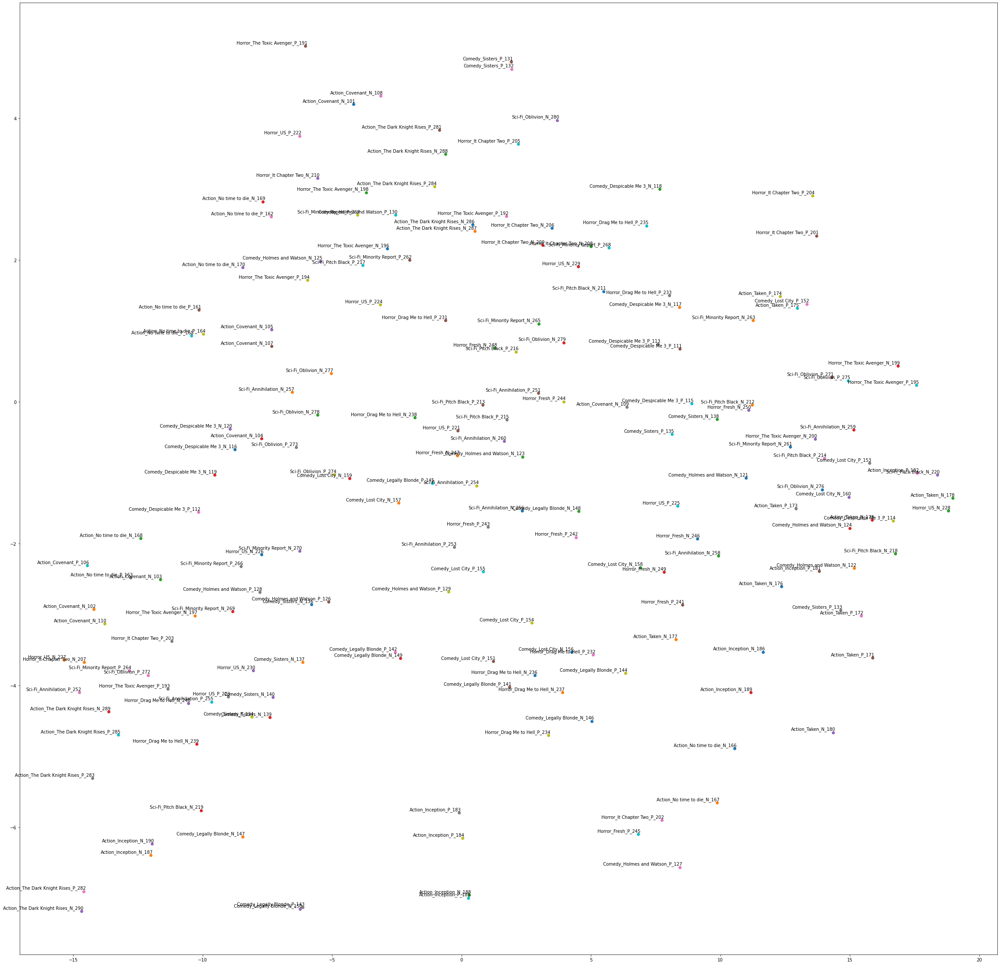

In [43]:
run_doc2vec_experiment(tokenized_documents_method_one, 100, 'Doc2Vec_Experiment_1')

Doc2Vec Experiment 2 - Data Wrangling Method 1 - 200 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


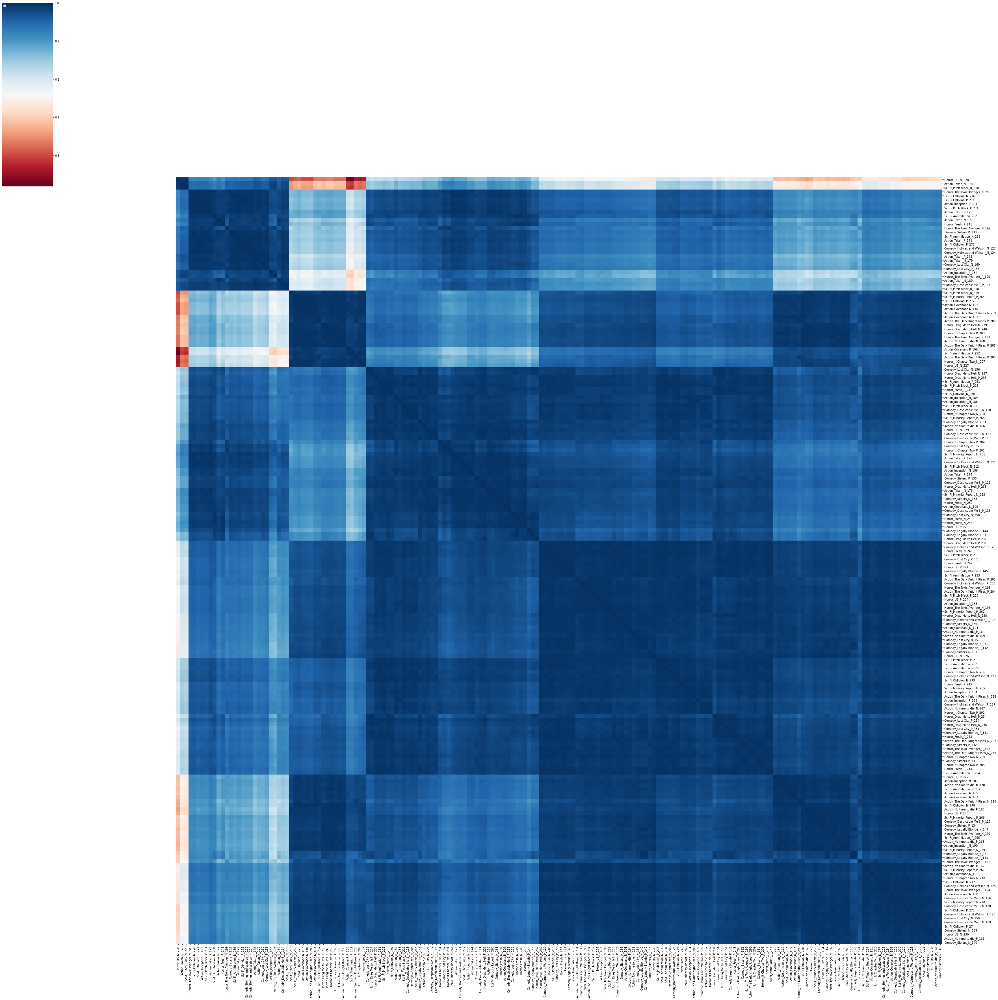

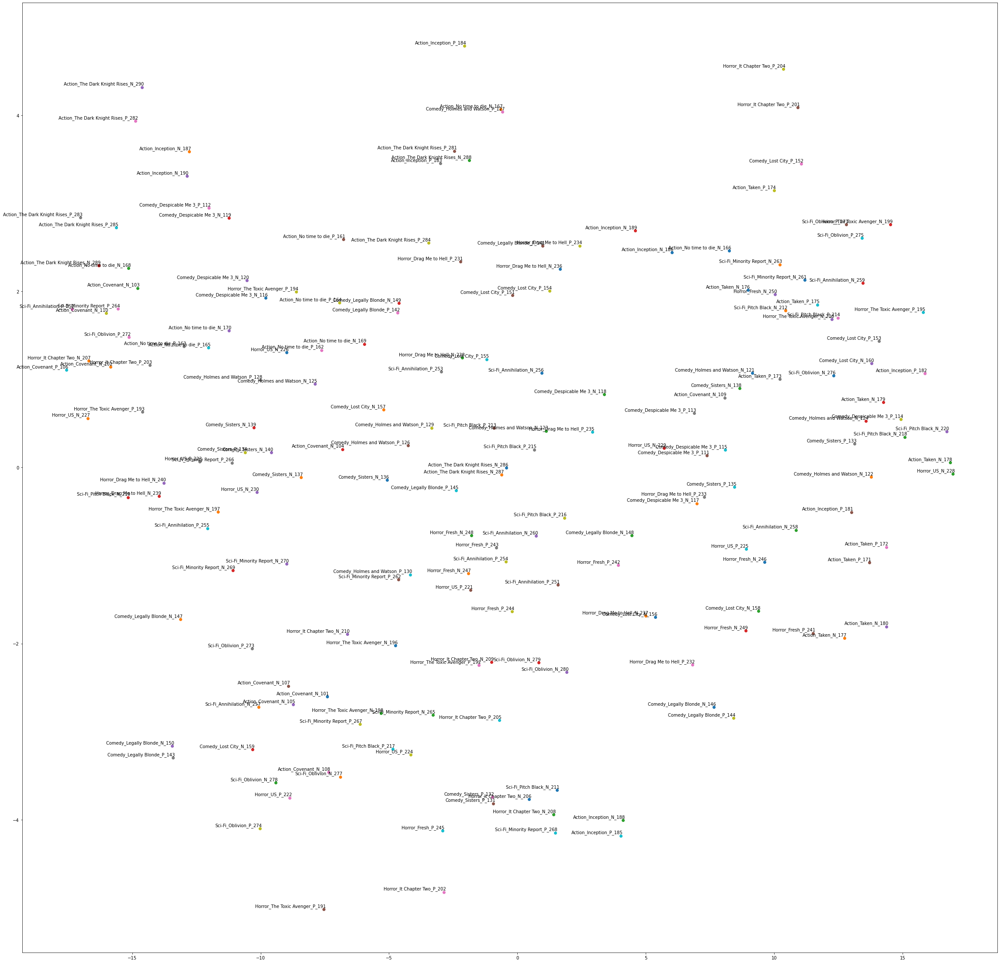

In [44]:
run_doc2vec_experiment(tokenized_documents_method_one, 200, 'Doc2Vec_Experiment_2')

Doc2Vec Experiment 3 - Data Wrangling Method 1 - 300 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


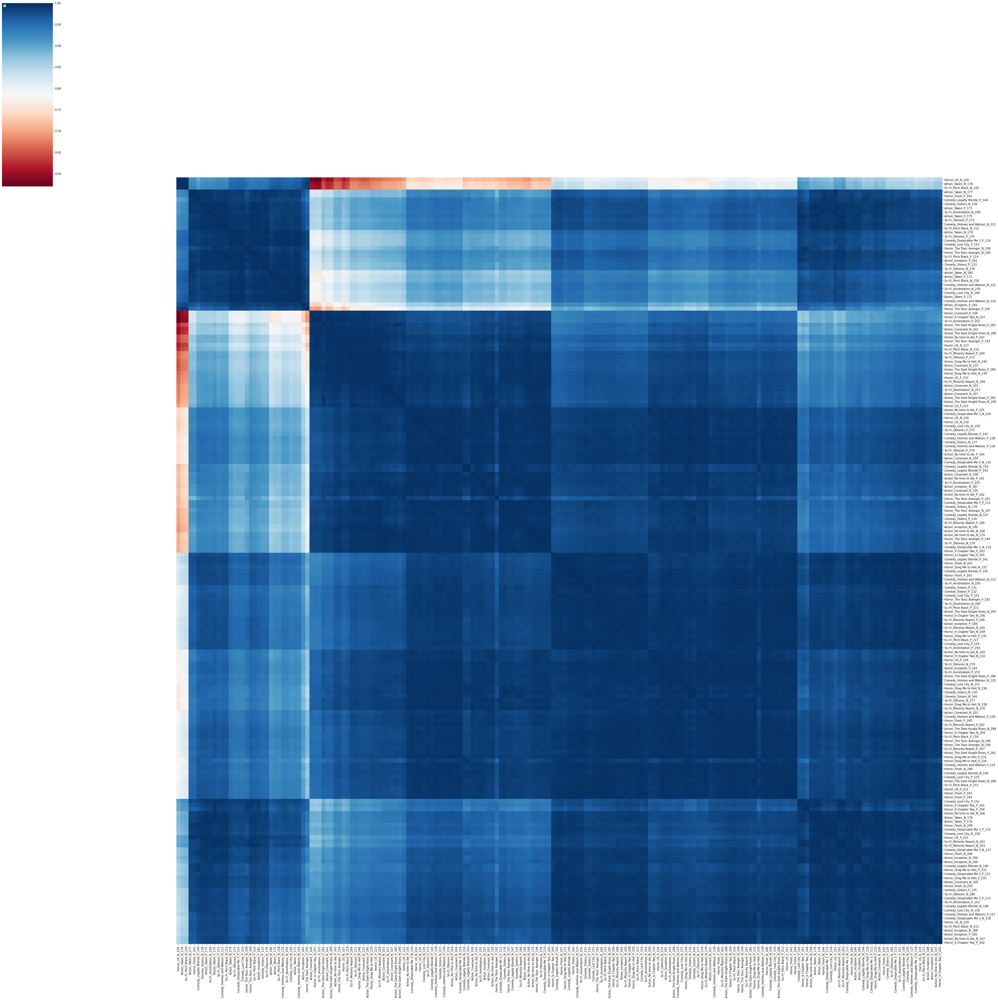

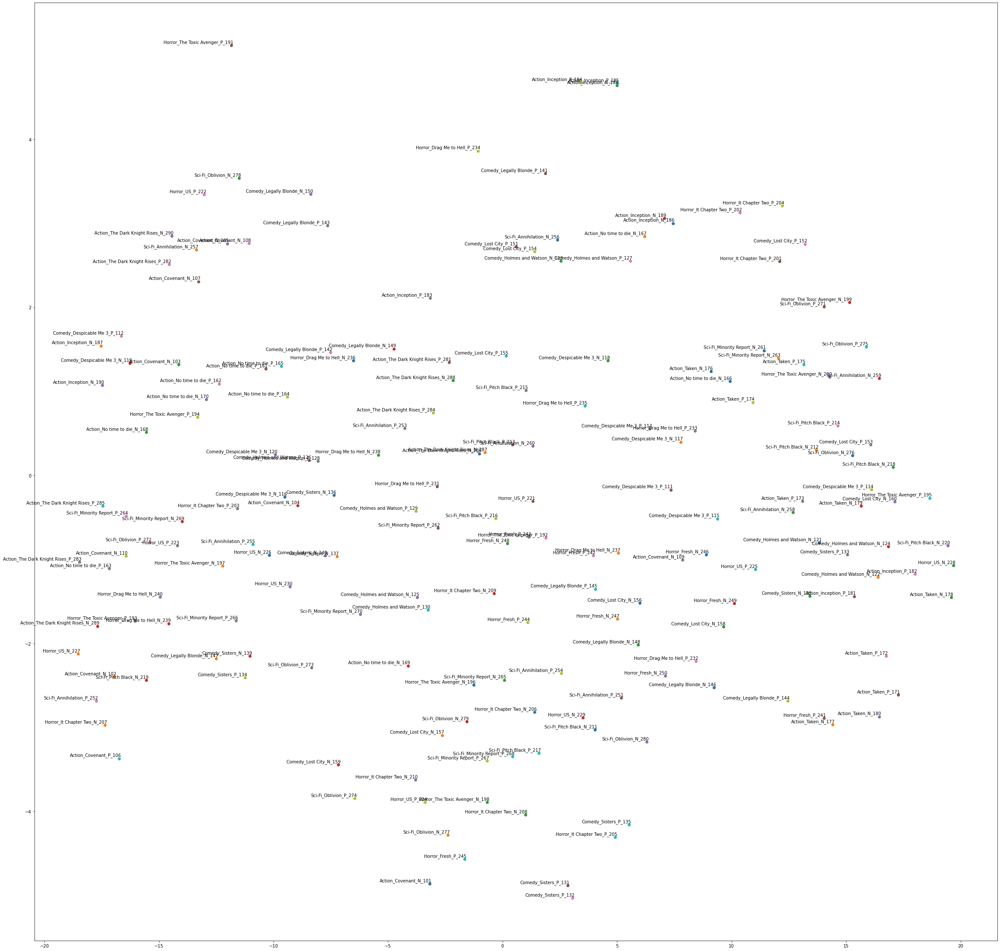

In [45]:
run_doc2vec_experiment(tokenized_documents_method_one, 300, 'Doc2Vec_Experiment_3')

Doc2Vec Experiment 4 - Data Wrangling Method 2 - 100 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


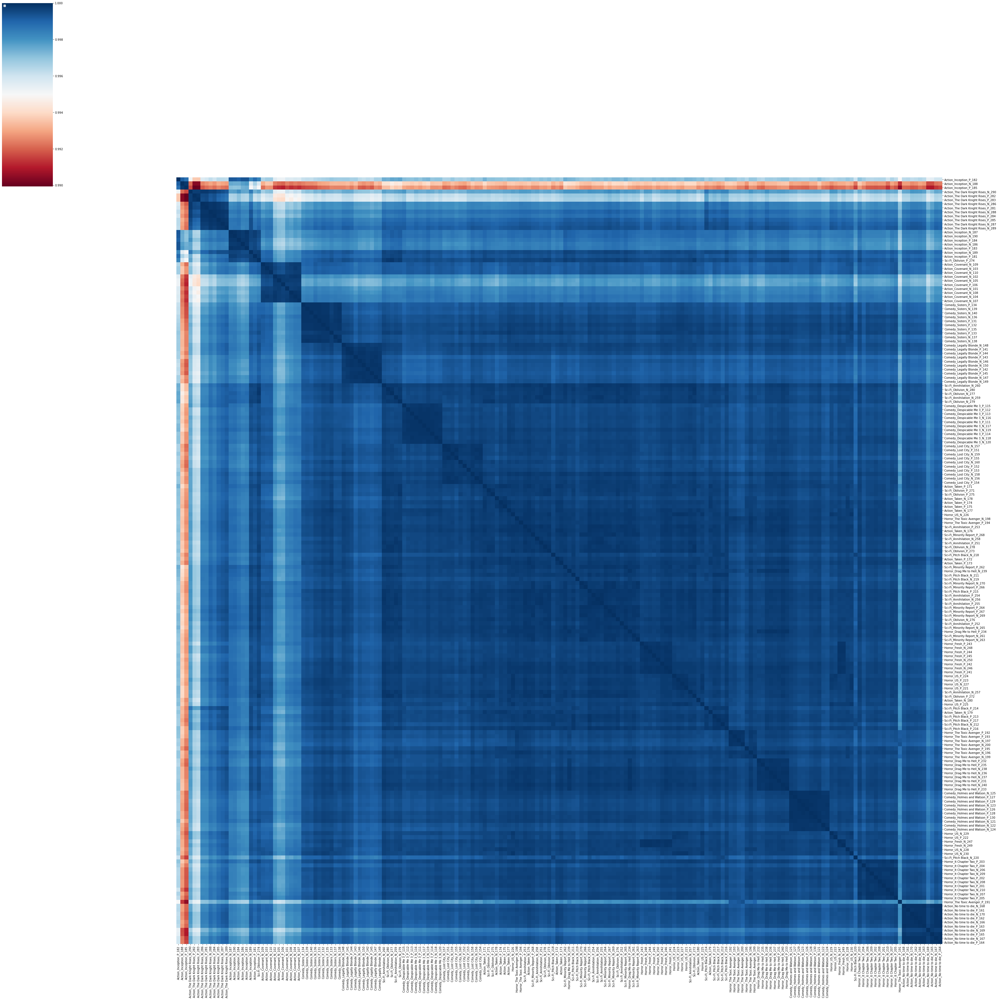

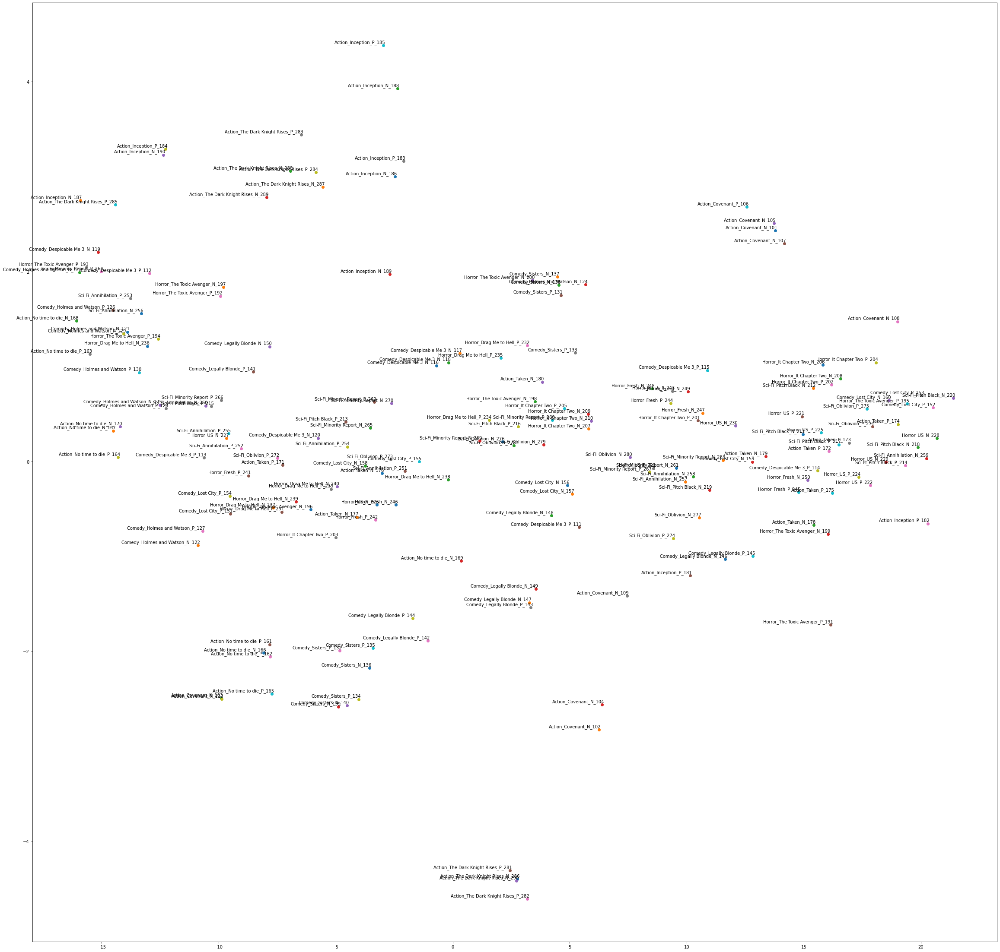

In [46]:
run_doc2vec_experiment(tokenized_documents_method_two, 100, 'Doc2Vec_Experiment_4')

Doc2Vec Experiment 5 - Data Wrangling Method 2 - 200 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


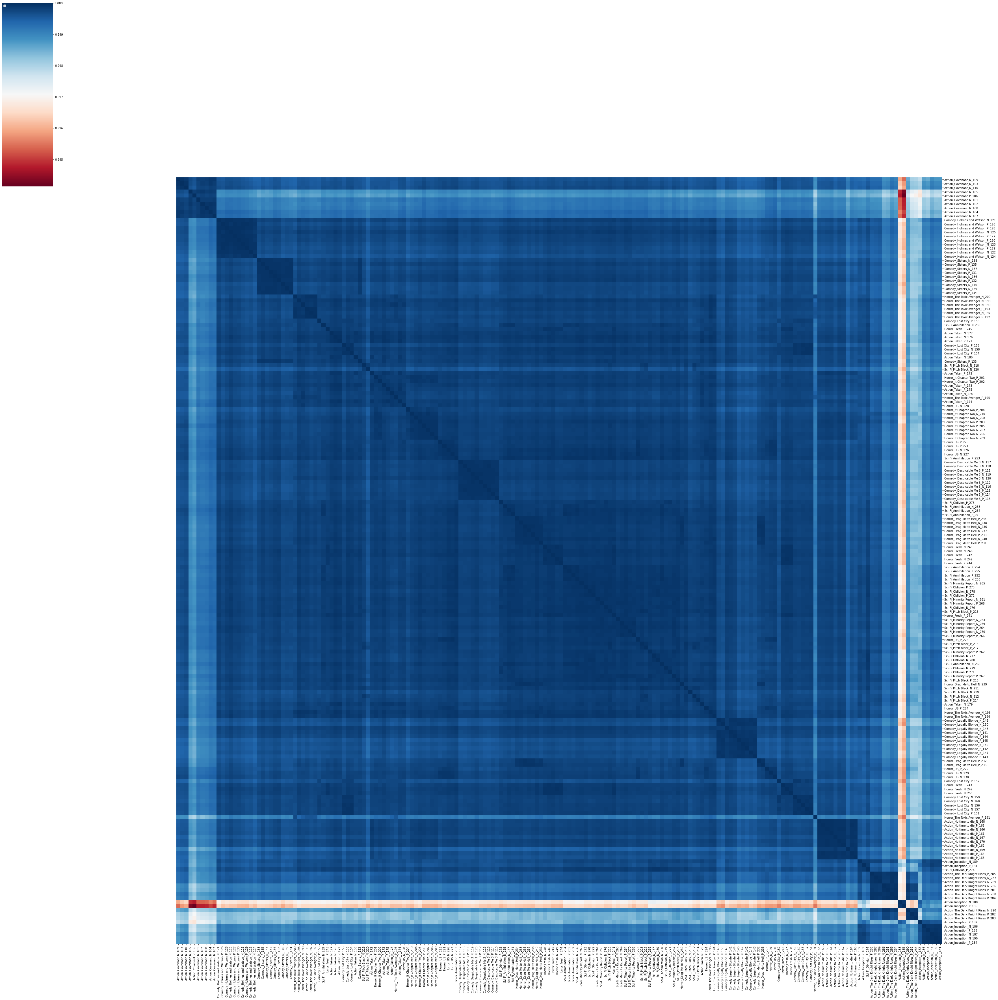

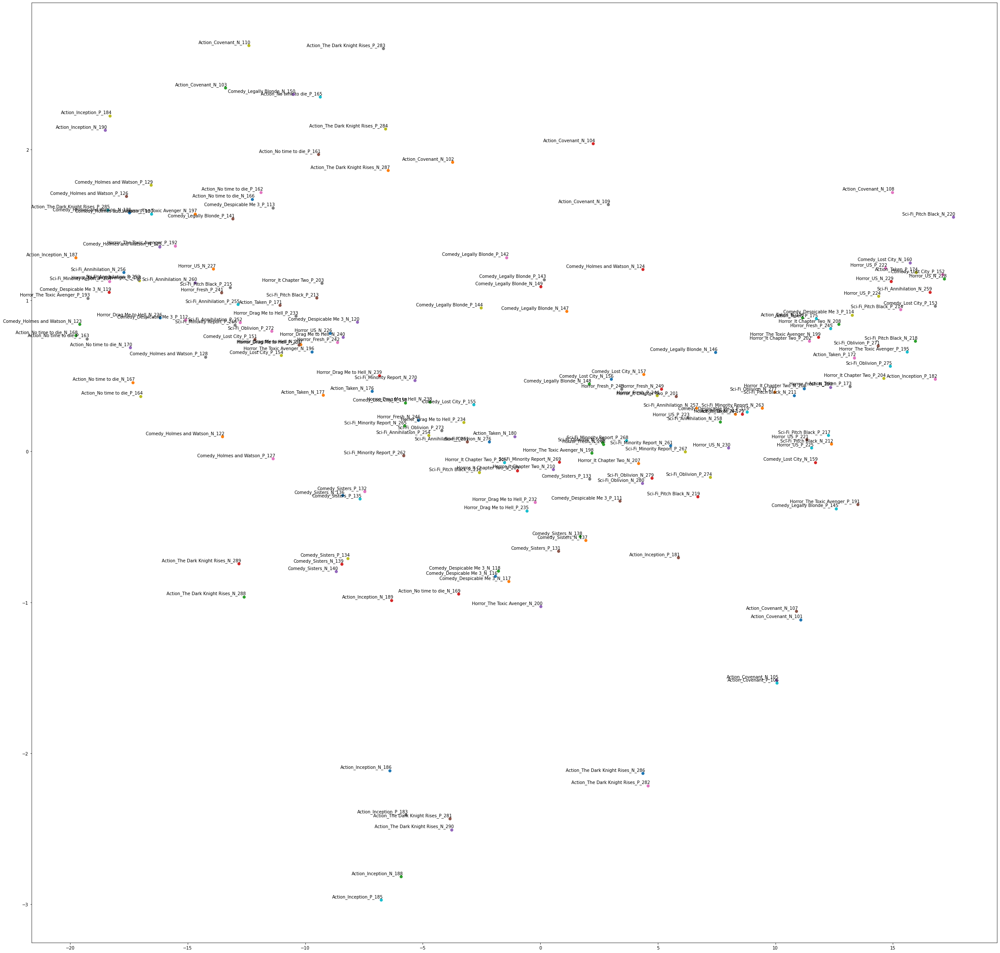

In [47]:
run_doc2vec_experiment(tokenized_documents_method_two, 200, 'Doc2Vec_Experiment_5')

Doc2Vec Experiment 6 - Data Wrangling Method 2 - 300 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


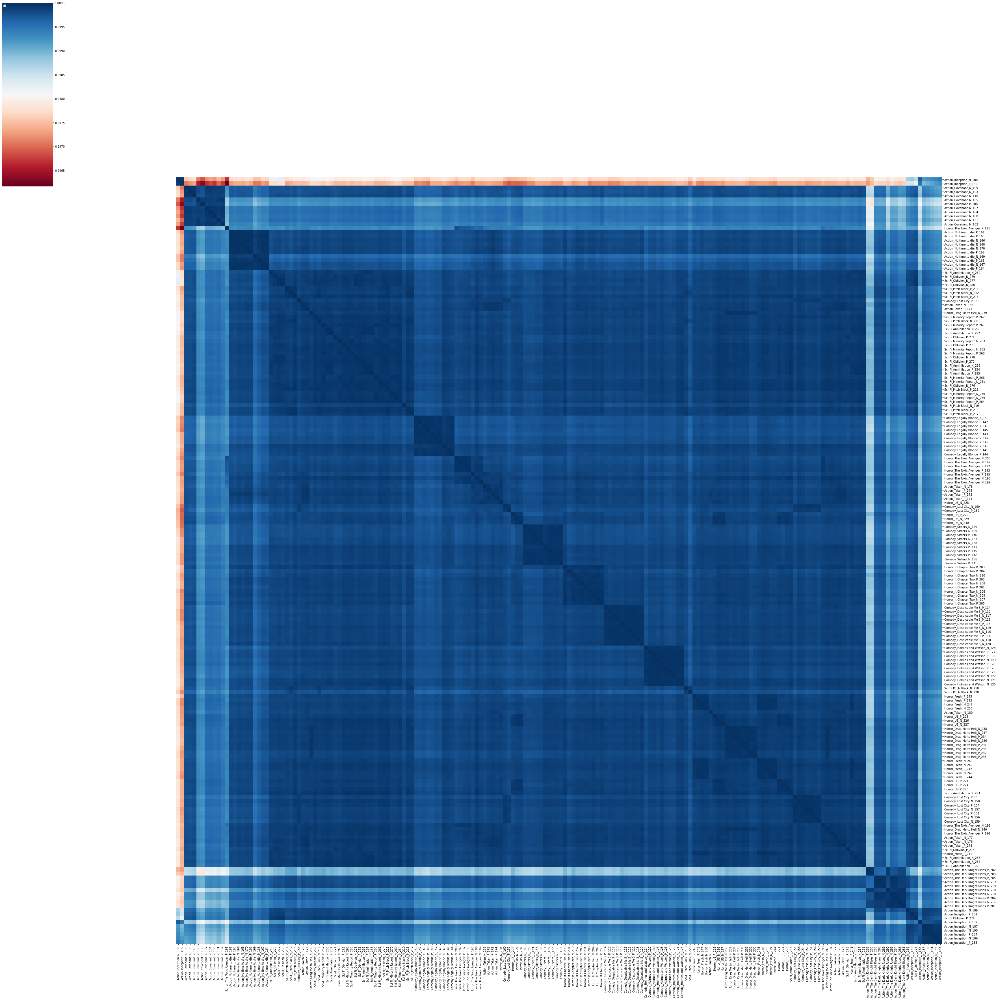

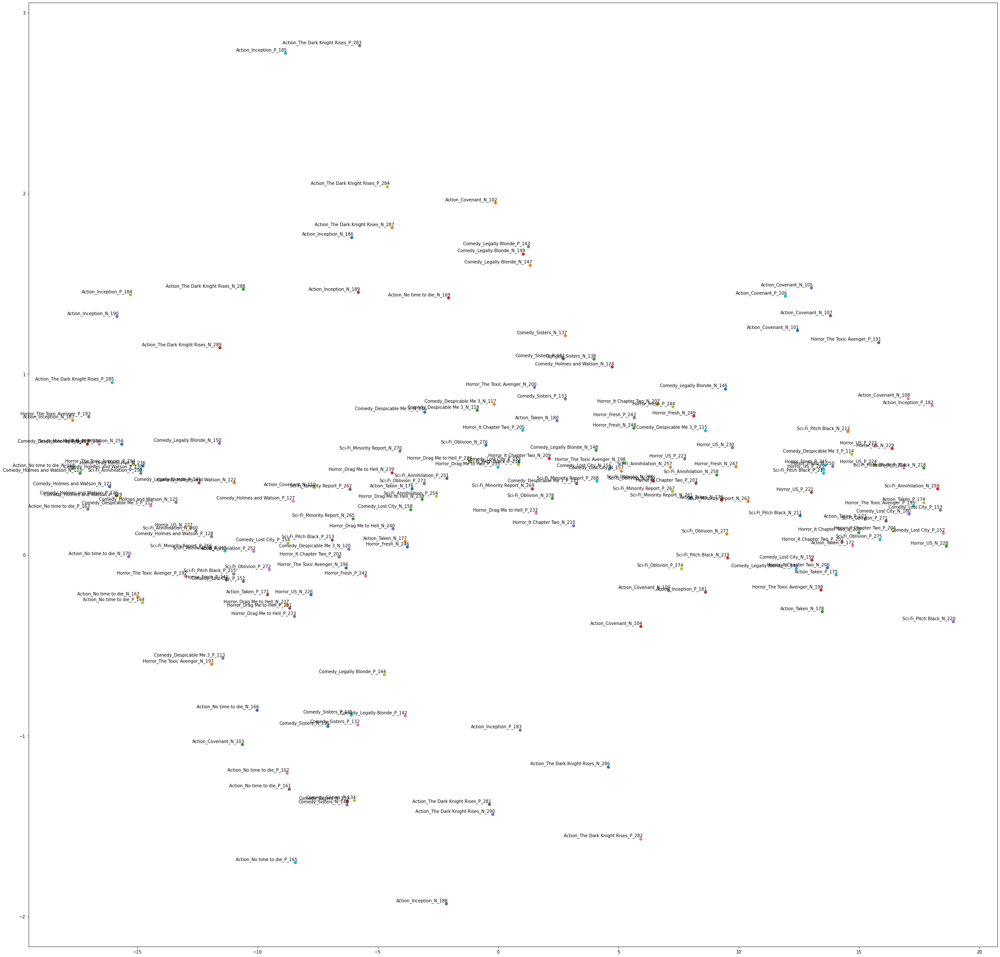

In [48]:
run_doc2vec_experiment(tokenized_documents_method_two, 300, 'Doc2Vec_Experiment_6')

Doc2Vec Experiment 7 - Data Wrangling Method 3 - 100 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


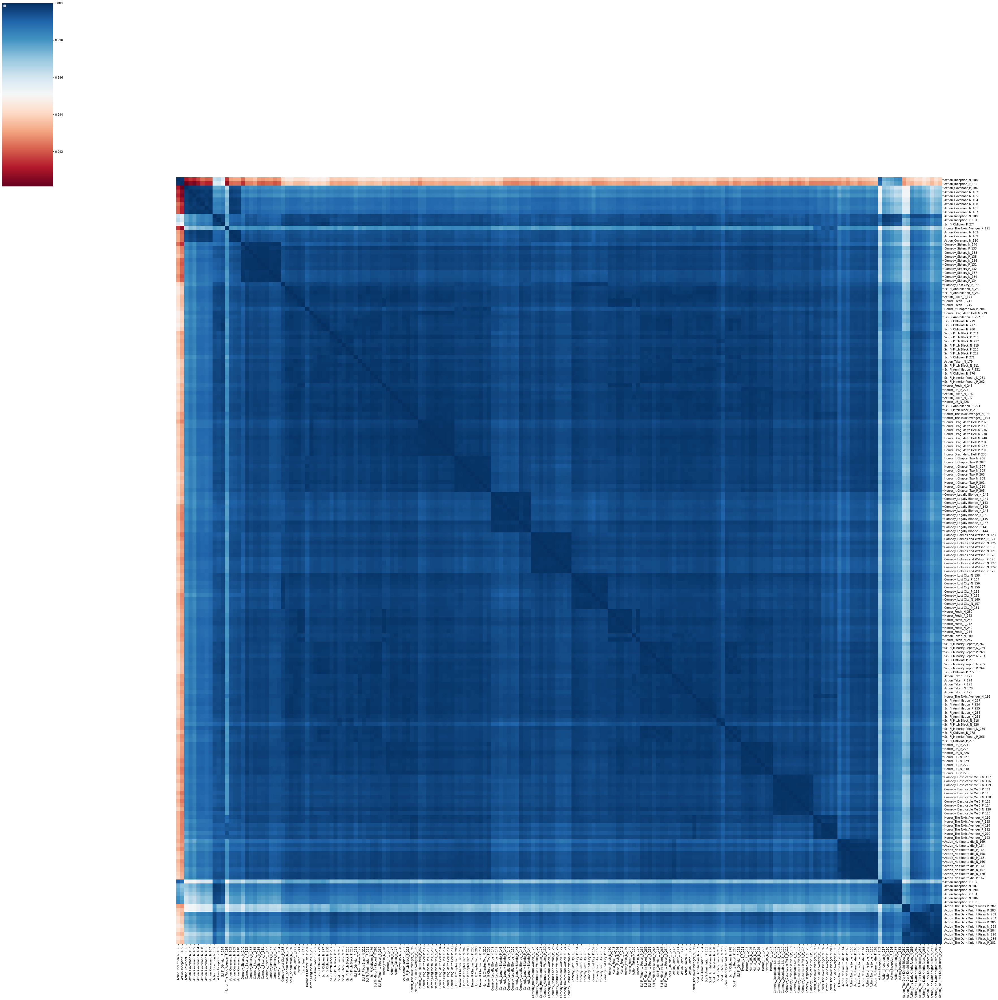

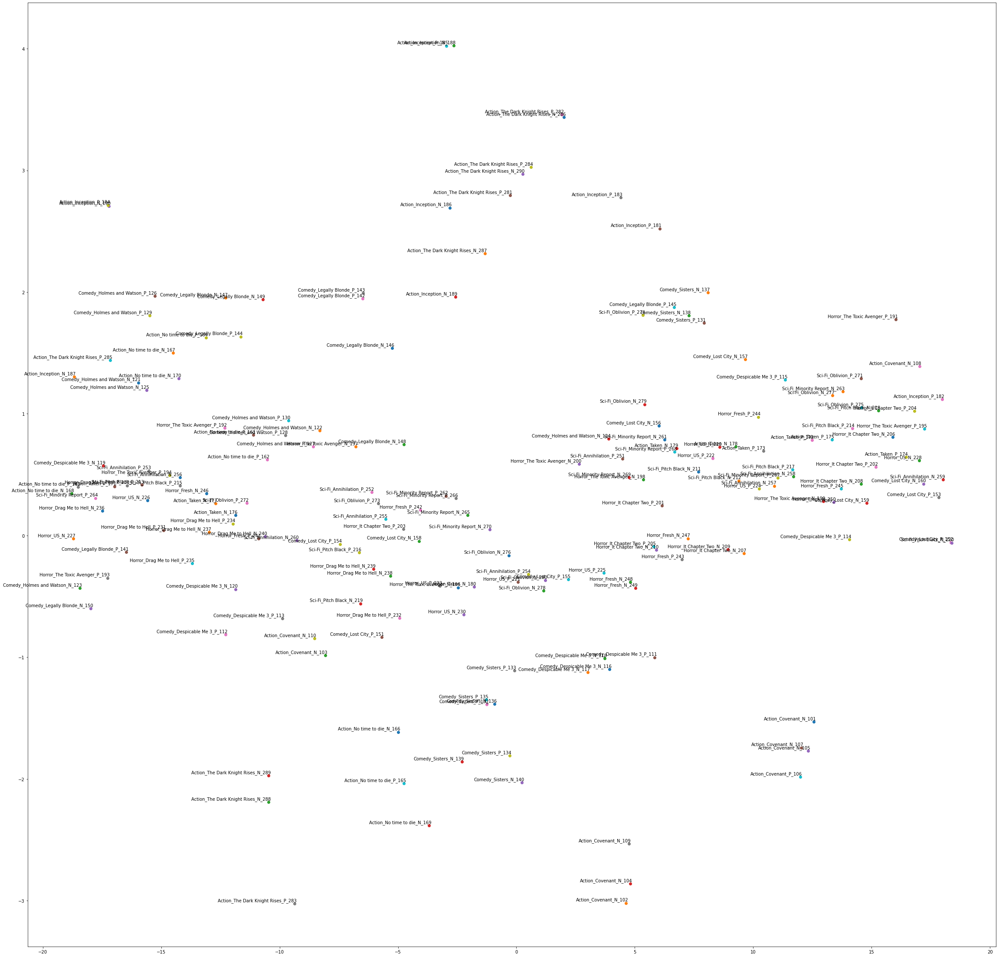

In [49]:
run_doc2vec_experiment(tokenized_documents_method_three, 100, 'Doc2Vec_Experiment_7')

Doc2Vec Experiment 8 - Data Wrangling Method 3 - 200 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


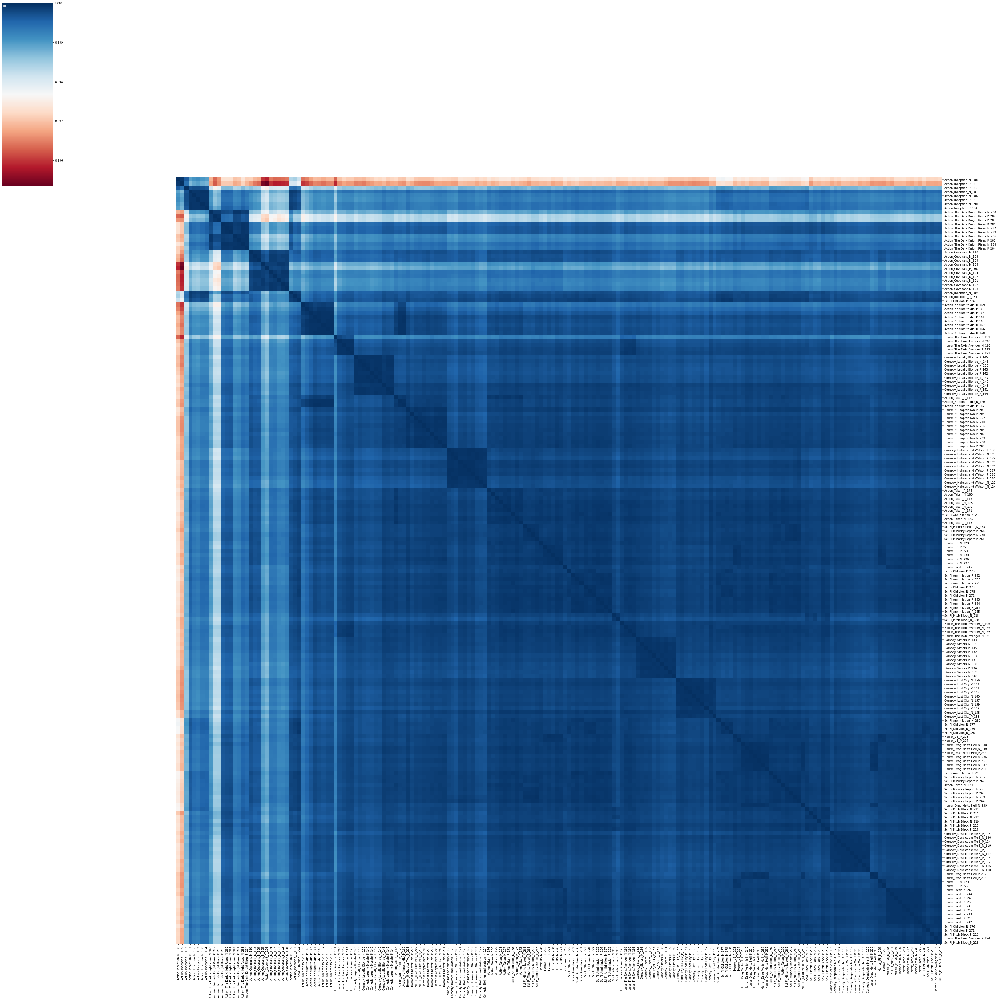

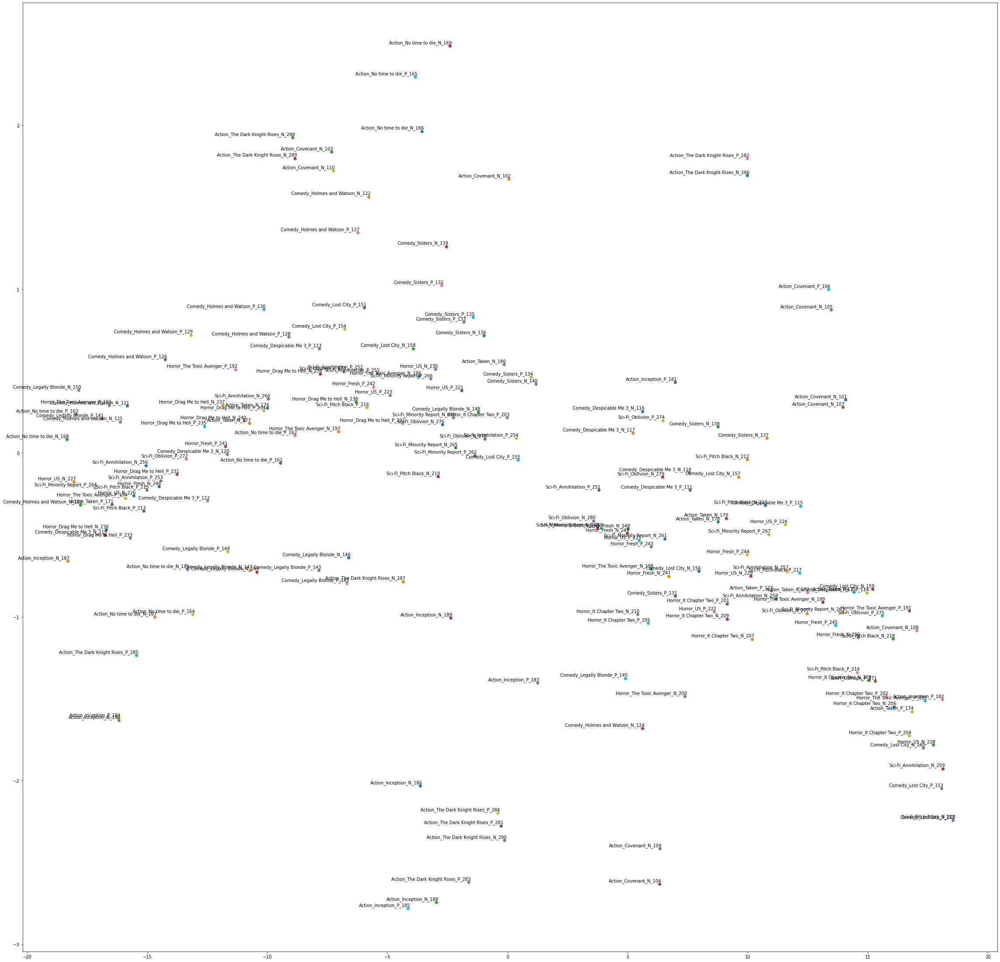

In [50]:
run_doc2vec_experiment(tokenized_documents_method_three, 200, 'Doc2Vec_Experiment_8')

Doc2Vec Experiment 9 - Data Wrangling Method 3 - 300 Embedding Dimensions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


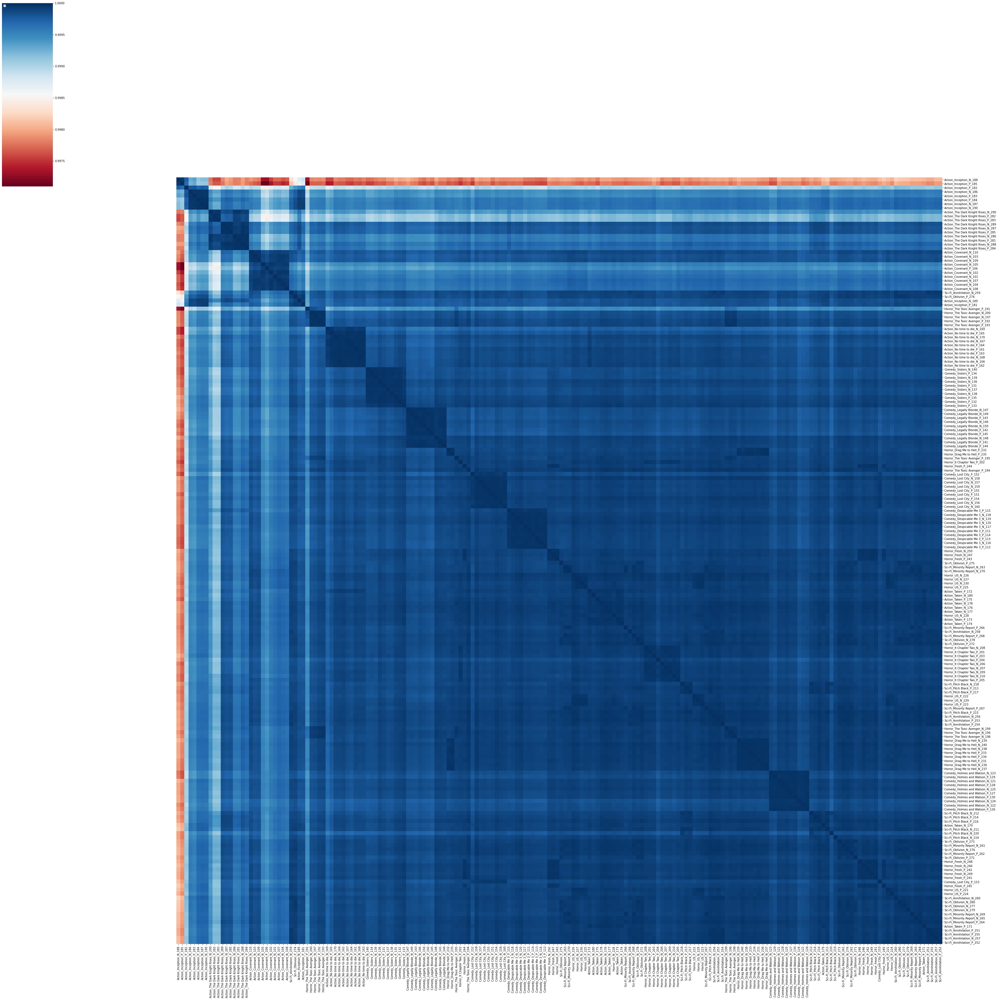

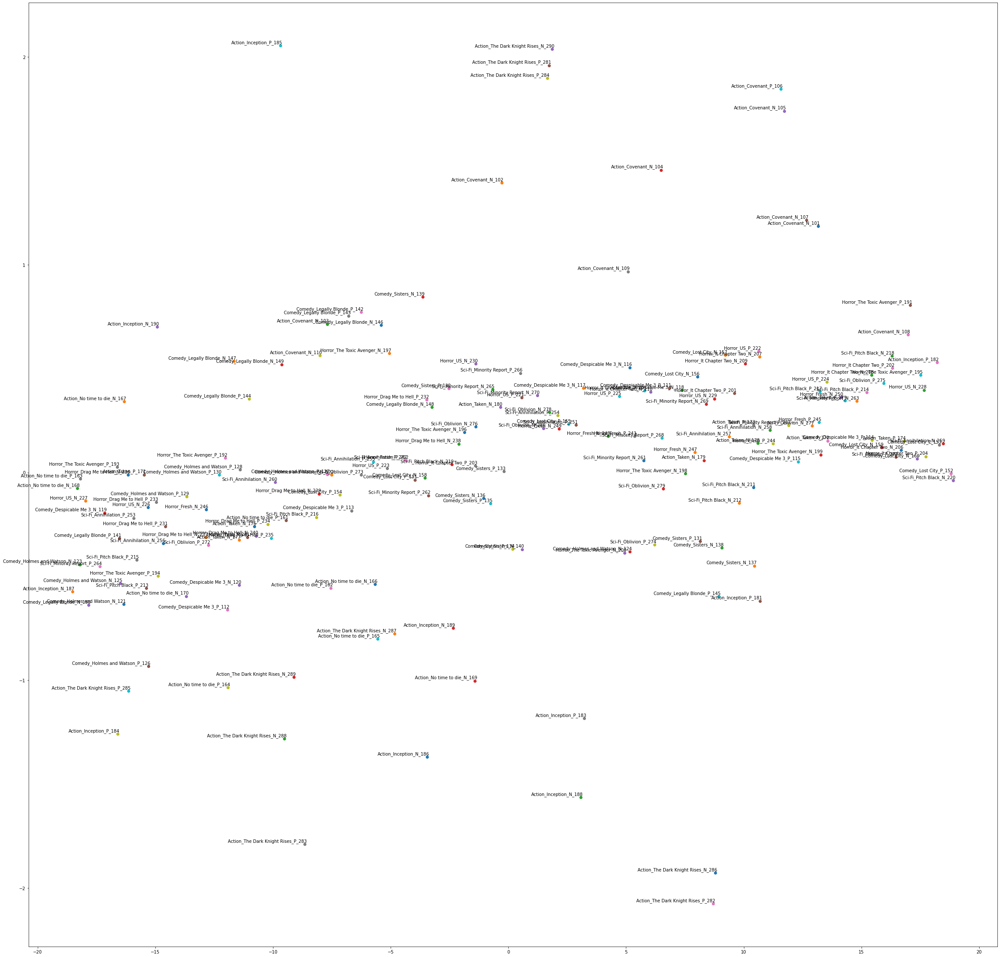

In [51]:
run_doc2vec_experiment(tokenized_documents_method_three, 300, 'Doc2Vec_Experiment_9')

### 2.4) Document Vectorization Using Word2Vec

#### 2.4.1) Definition of Utility Functions For Word2Vec Experiments

We can now examine how closely related certain words from our corpus are related to one another semantically. For this analysis, we can begin by selecting 100 terms from our corpus and representing them via their respective Word2Vec embedding vectors. We can then create heatmaps that visualize the pairwise cosine similarity measures between these embedding vectors and T-SNE plots that depict how the embedding vectors appear to cluster together. 

We can conduct these experiments 9 times: three times for each data wrangling method leveraging 100, 200, and 300 Word2Vec embedding dimensions in each experiment, respectively.

In [52]:
def get_word2vec_vectors(documents: List[TokenizedDocument], embedding_size: int) -> pd.DataFrame:
    tokens = [x.tokens for x in documents]

    # https://github.com/RaRe-Technologies/gensim/wiki/Migrating-from-Gensim-3.x-to-4

    # gensim 3.8
    #word2vec_model = Word2Vec(tokens, size=embedding_size, window=3, min_count=1, workers=12)

    # gensim 4.3.1
    word2vec_model = Word2Vec(sentences=tokens, vector_size=embedding_size, window=3, min_count=1, workers=12)

    # gensim 3.8
    #vectors = {}
    #for i in word2vec_model.wv.vocab:
    #    temp_vec = word2vec_model.wv[i]
    #    vectors[i] = temp_vec

    # gensim 4.3.1
    vectors = {}
    for i in word2vec_model.wv.index_to_key:
        temp_vec = word2vec_model.wv[i]
        vectors[i] = temp_vec

    # Changes made:
    #   1. The size parameter in Word2Vec has been renamed to vector_size.
    #   2. Instead of iterating through word2vec_model.wv.vocab, you should now use 
    #      word2vec_model.wv.index_to_key to get the list of words in the vocabulary.


    result = pd.DataFrame(vectors).transpose()
    result = result.sort_index()
    return result
   
    
def run_word2vec_experiment(documents: List[Document],
#                            clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                            embedding_size: int,
                            chosen_tokens: List[str],
                            experiment_name: str):
#    cleaned_documents = clean_func(documents)
    cleaned_documents = documents

    word2vec_df = get_word2vec_vectors(cleaned_documents, embedding_size)
    filtered_word2vec_df = word2vec_df.loc[chosen_tokens].copy()

    plot_tsne(filtered_word2vec_df, 30, experiment_name)
    plot_similarity_matrix(filtered_word2vec_df, experiment_name)
    plot_similarity_clustermap(filtered_word2vec_df, experiment_name)
    
    
    
#extra_terms_method_one = [
#    'bond',
#    'craig',
#    'star',
#    'casino',
#    'action'
#]


#def get_all_tokens(documents: List[TokenizedDocument]) -> List[str]:
#    tokens = {y for x in documents for y in x.tokens}
#    return sorted(list(tokens))

#all_tokens = get_all_tokens(tokenized_documents)



# Get our terms to examine in experiements 4-12
#all_tokens_method_one = get_all_tokens(tokenized_documents_method_one)
#all_tokens_method_two = get_all_tokens(tokenized_documents_method_two)
#all_tokens_method_three = get_all_tokens(tokenized_documents_method_three)


#chosen_tokens_method_one = random.choices(all_tokens_method_one, k=100 - len(stemmed_important_prevalent_terms)) + stemmed_important_prevalent_terms
#chosen_tokens_method_two = random.choices(all_tokens_method_two, k=100 - len(lemmatized_important_prevalent_terms)) + lemmatized_important_prevalent_terms
#chosen_tokens_method_three = random.choices(all_tokens_method_three, k=100 - len(lemmatized_important_prevalent_terms)) + lemmatized_important_prevalent_terms


#lemmatizer = WordNetLemmatizer()
#lemmatized_chosen_tokens = [lemmatizer.lemmatize(x) for x in chosen_tokens]
#stemmed_chosen_tokens = [stemmer.stem(x) for x in lemmatized_chosen_tokens]




chosen_tokens_method_one = top_96_tfidf_terms_method_one_list + stemmed_important_prevalent_terms
chosen_tokens_method_two = top_96_tfidf_terms_method_two_list + lemmatized_important_prevalent_terms
chosen_tokens_method_three = top_96_tfidf_terms_method_three_list + lemmatized_important_prevalent_terms


#### 2.4.2) Word2Vec Experiment Outputs - T-SNE Plots and Heatmaps

Having defined the functions needed for our analyses, let's run the experiment for each of our nine experimental scenarios of interest.

Word2Vec Experiment 1 - Data Wrangling Method 1 - 100 Embedding Dimensions

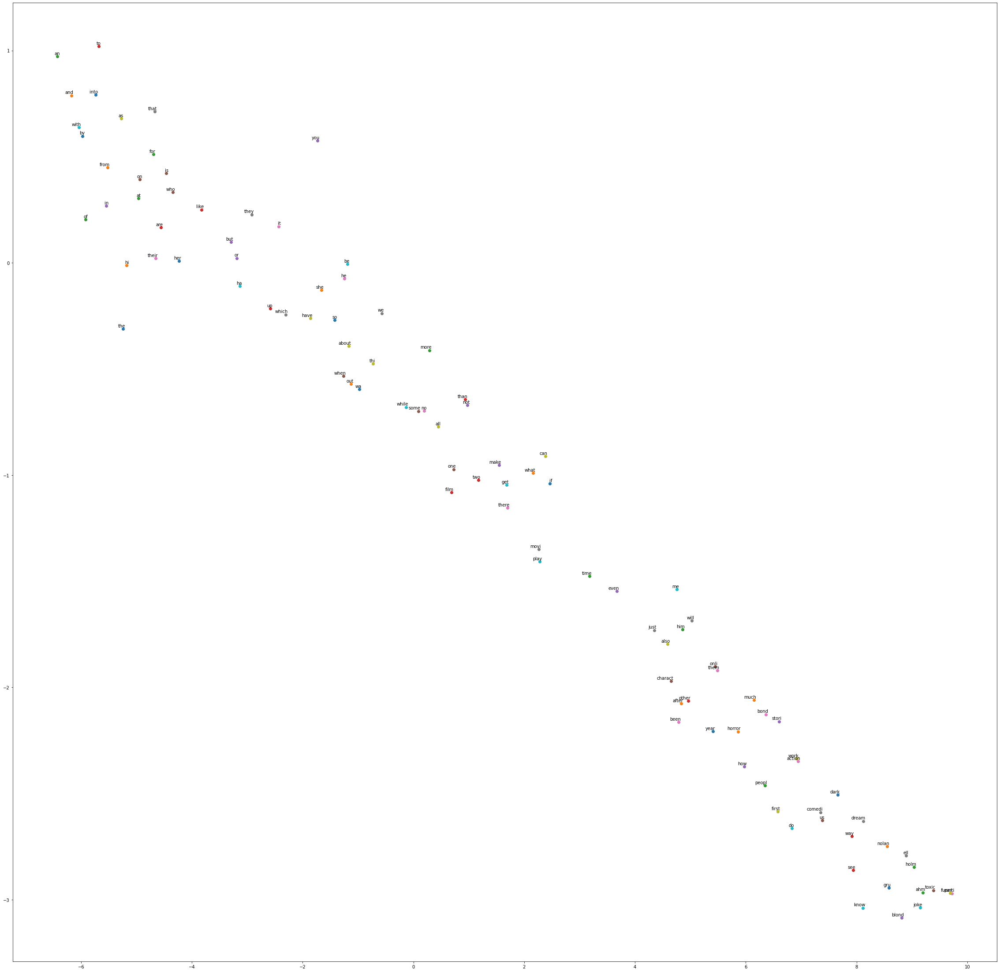

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


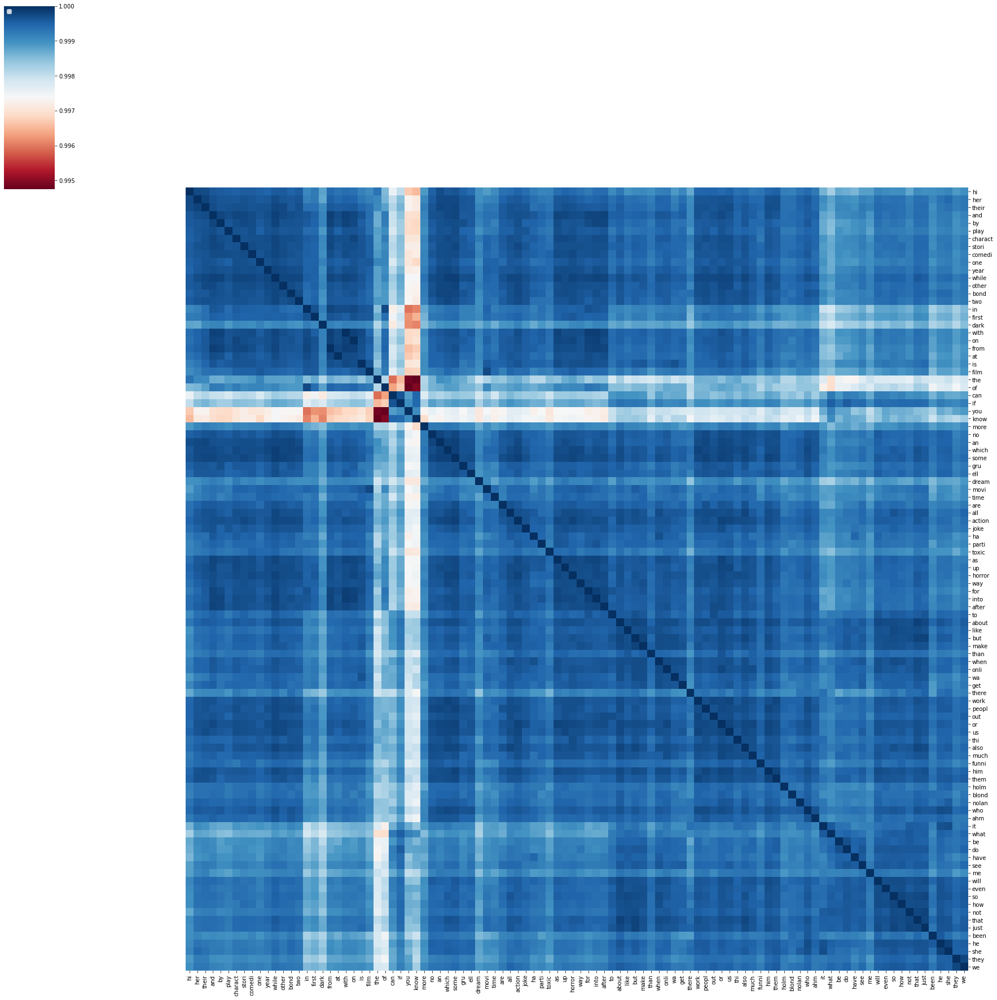

In [53]:
run_word2vec_experiment(tokenized_documents_method_one, 100, chosen_tokens_method_one, 'Word2Vec_Experiment_1')

Word2Vec Experiment 2 - Data Wrangling Method 1 - 200 Embedding Dimensions

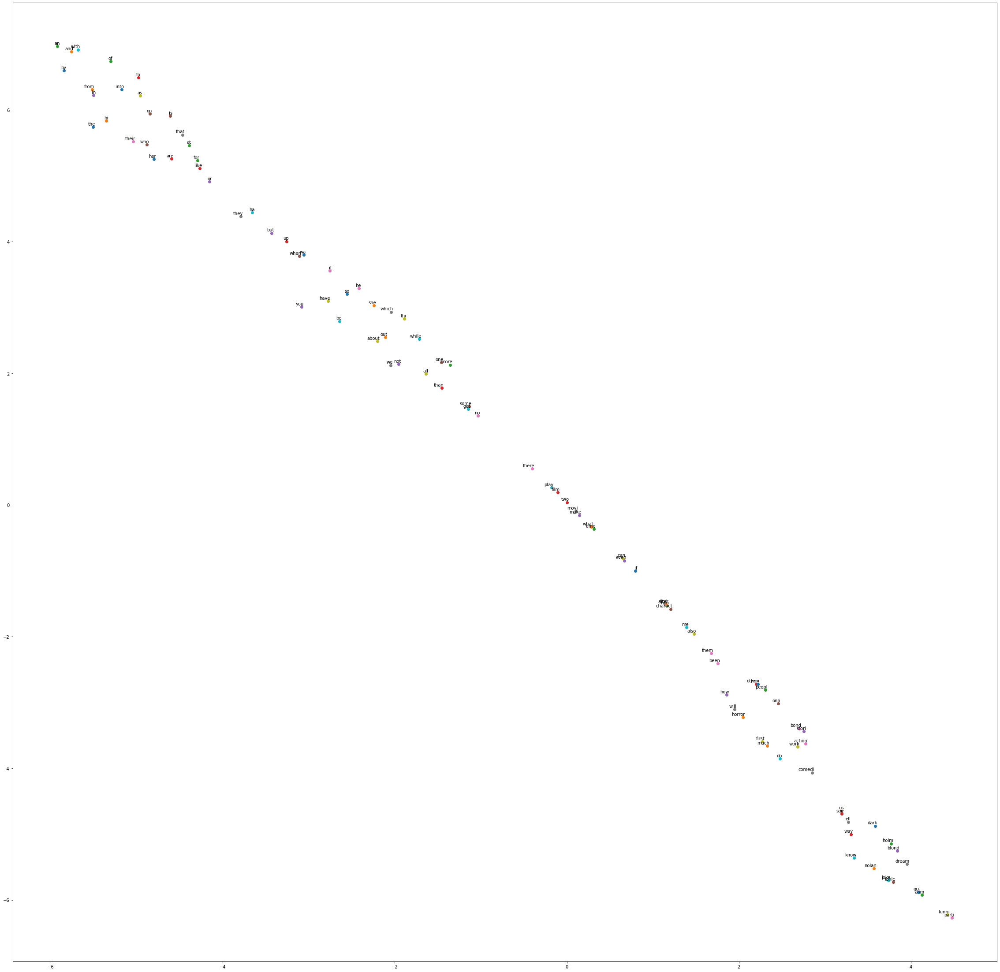

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


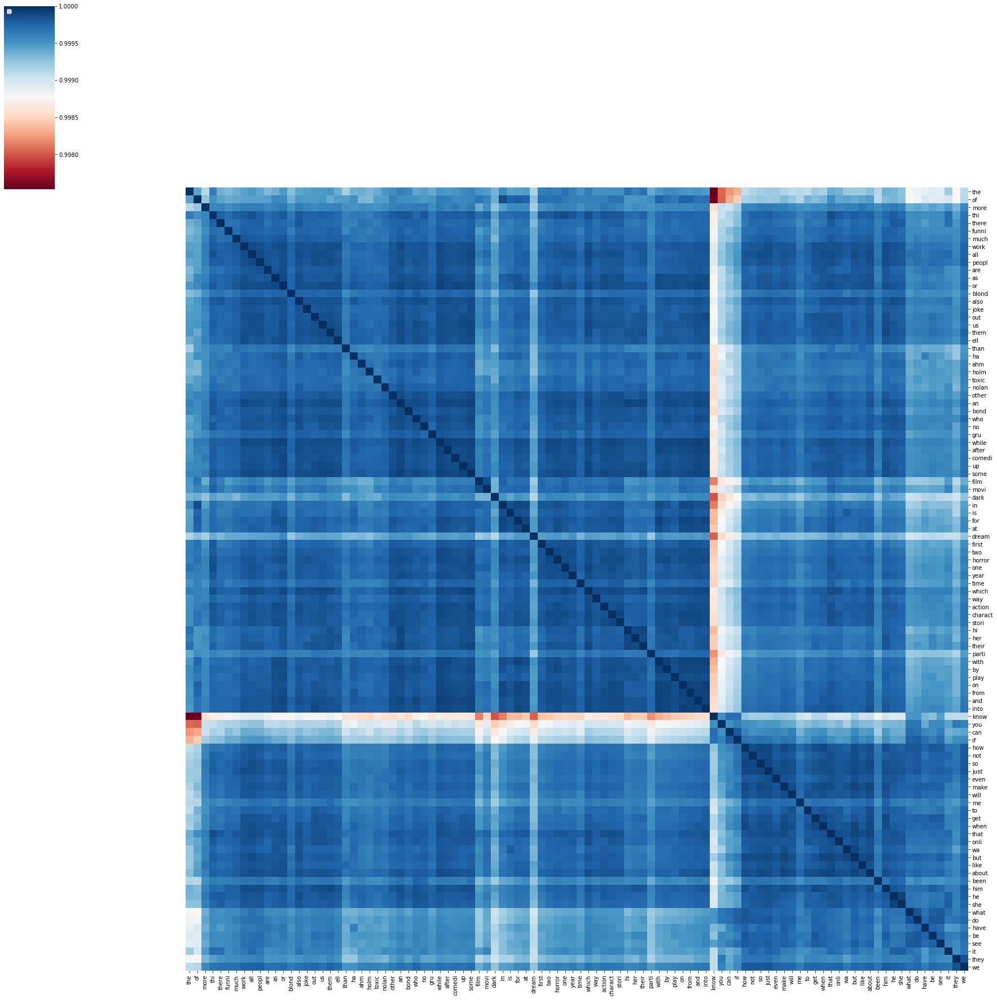

In [54]:
run_word2vec_experiment(tokenized_documents_method_one, 200, chosen_tokens_method_one, 'Word2Vec_Experiment_2')

Word2Vec Experiment 3 - Data Wrangling Method 1 - 300 Embedding Dimensions

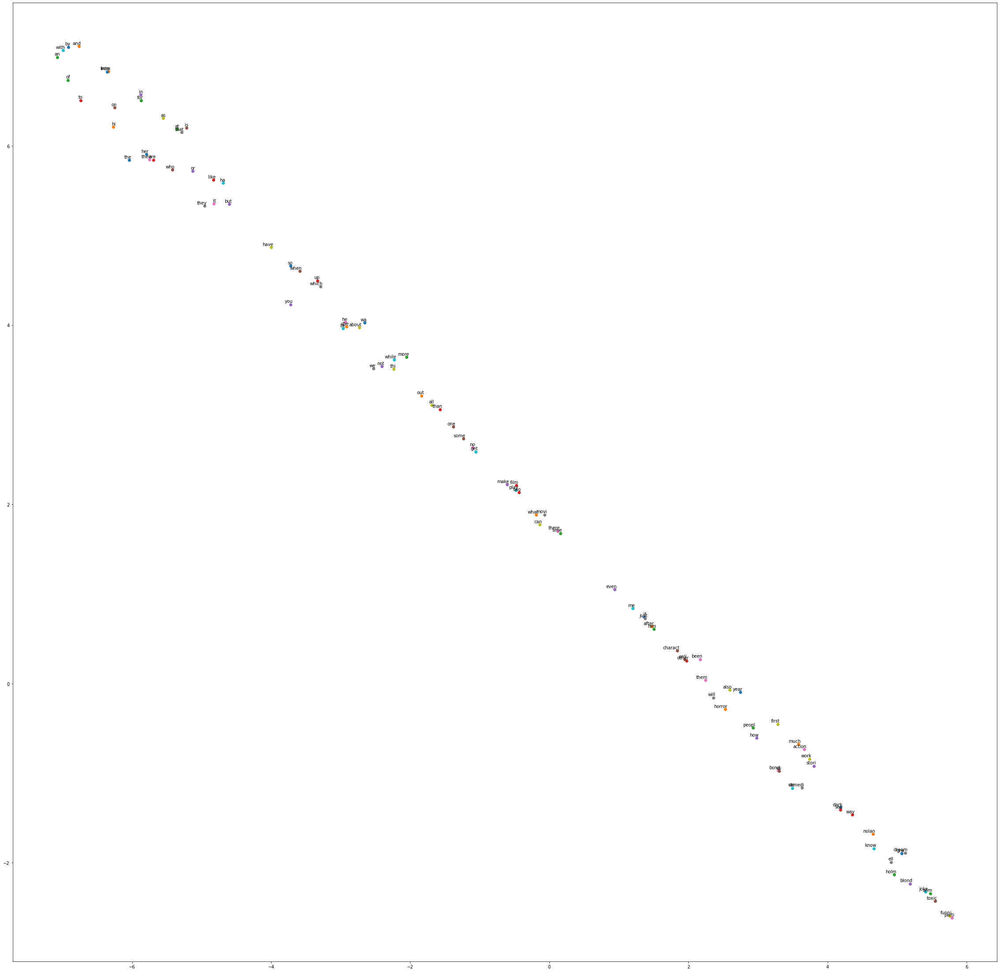

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


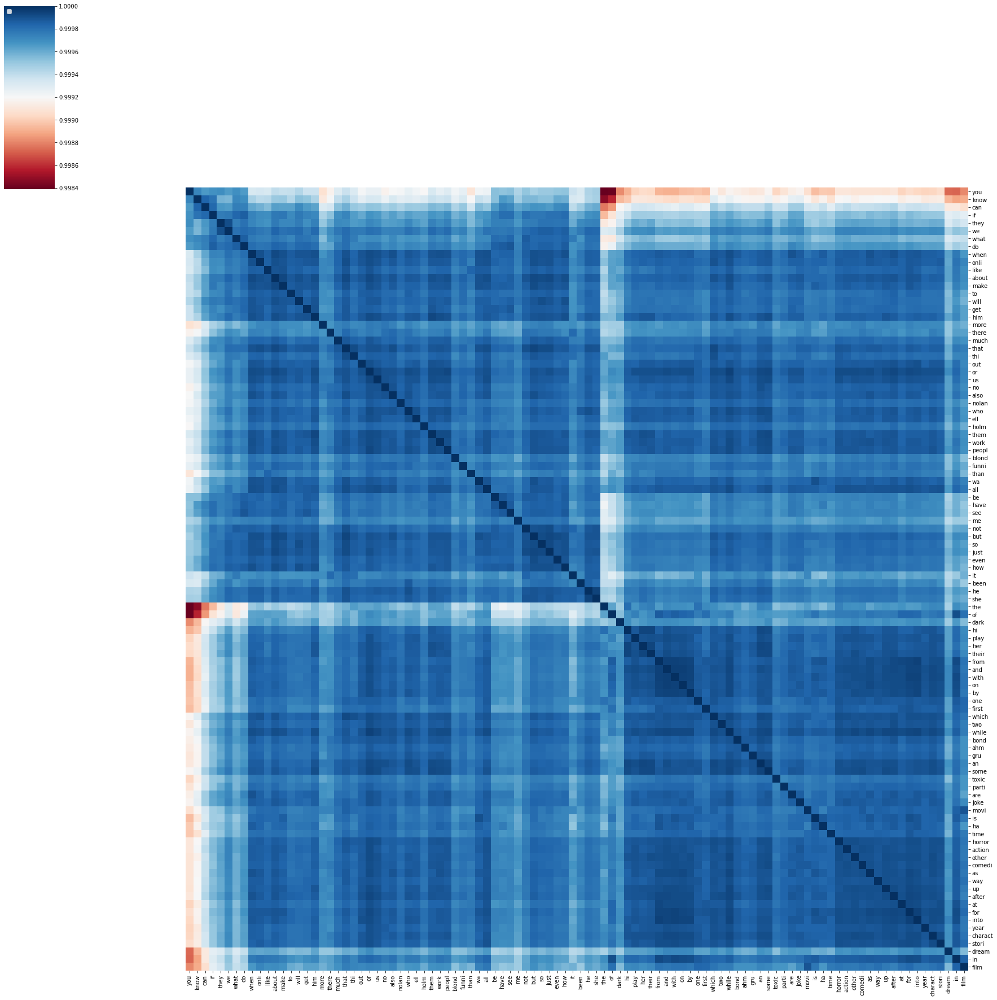

In [55]:
run_word2vec_experiment(tokenized_documents_method_one, 300, chosen_tokens_method_one, 'Word2Vec_Experiment_3')

Word2Vec Experiment 4 - Data Wrangling Method 2 - 100 Embedding Dimensions

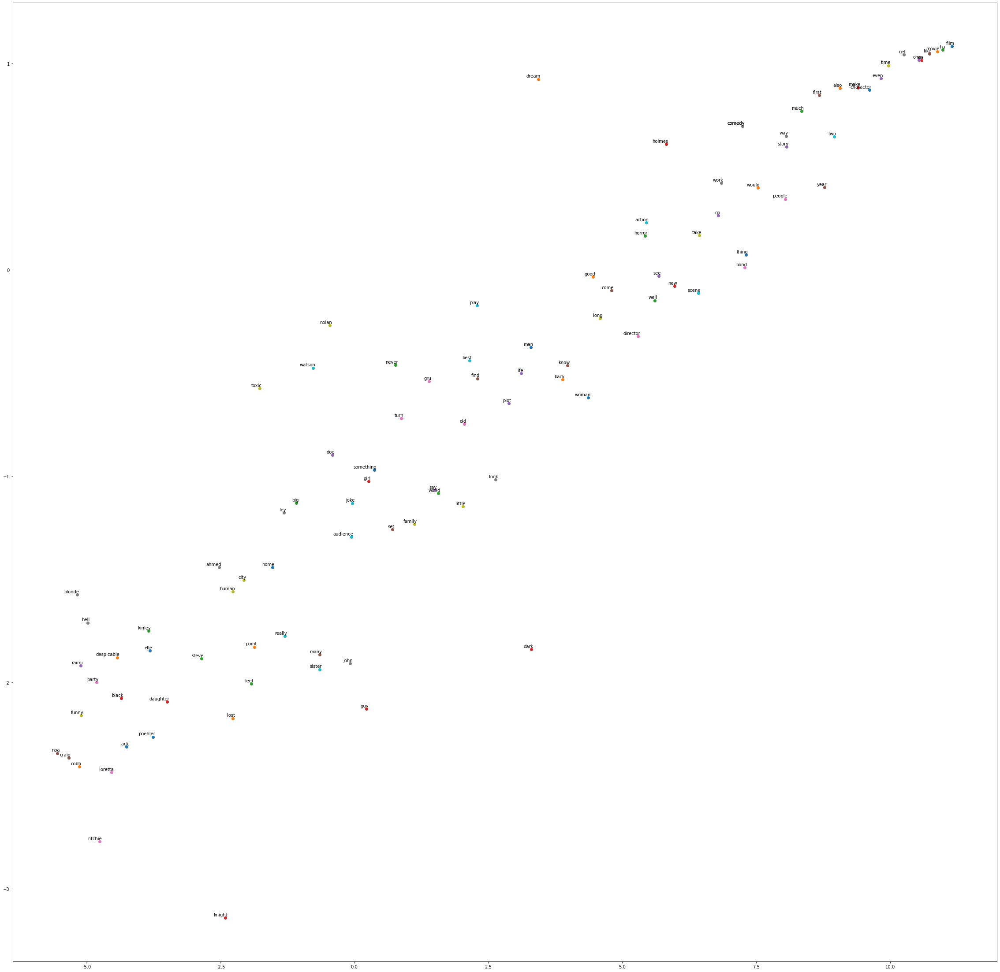

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


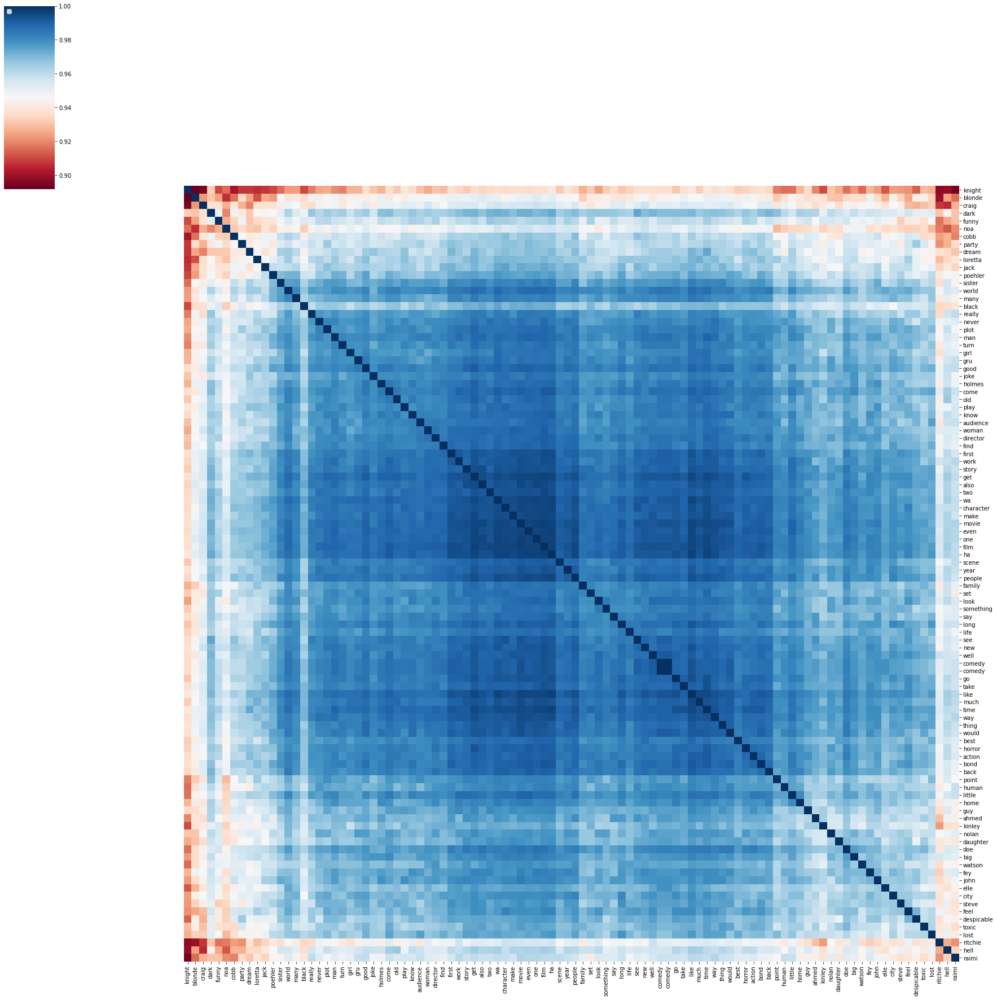

In [56]:
run_word2vec_experiment(tokenized_documents_method_two, 100, chosen_tokens_method_two, 'Word2Vec_Experiment_4')

Word2Vec Experiment 5 - Data Wrangling Method 2 - 200 Embedding Dimensions

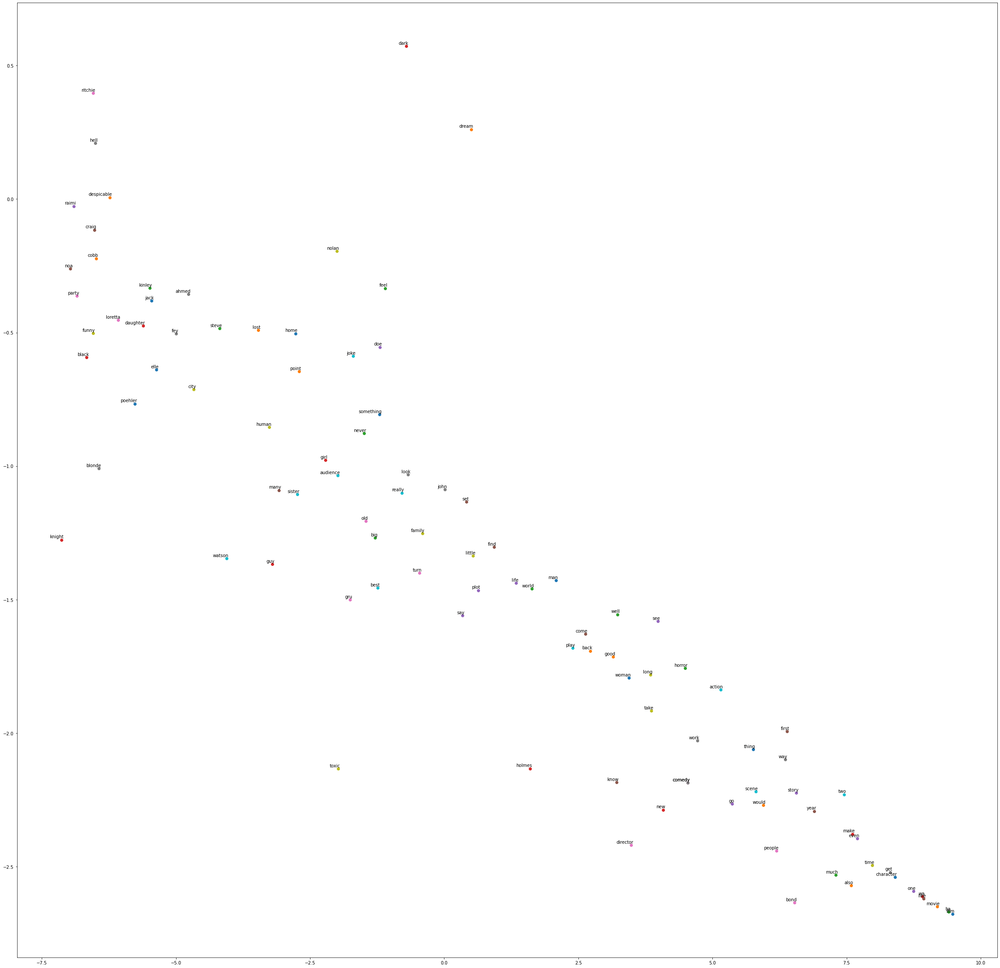

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


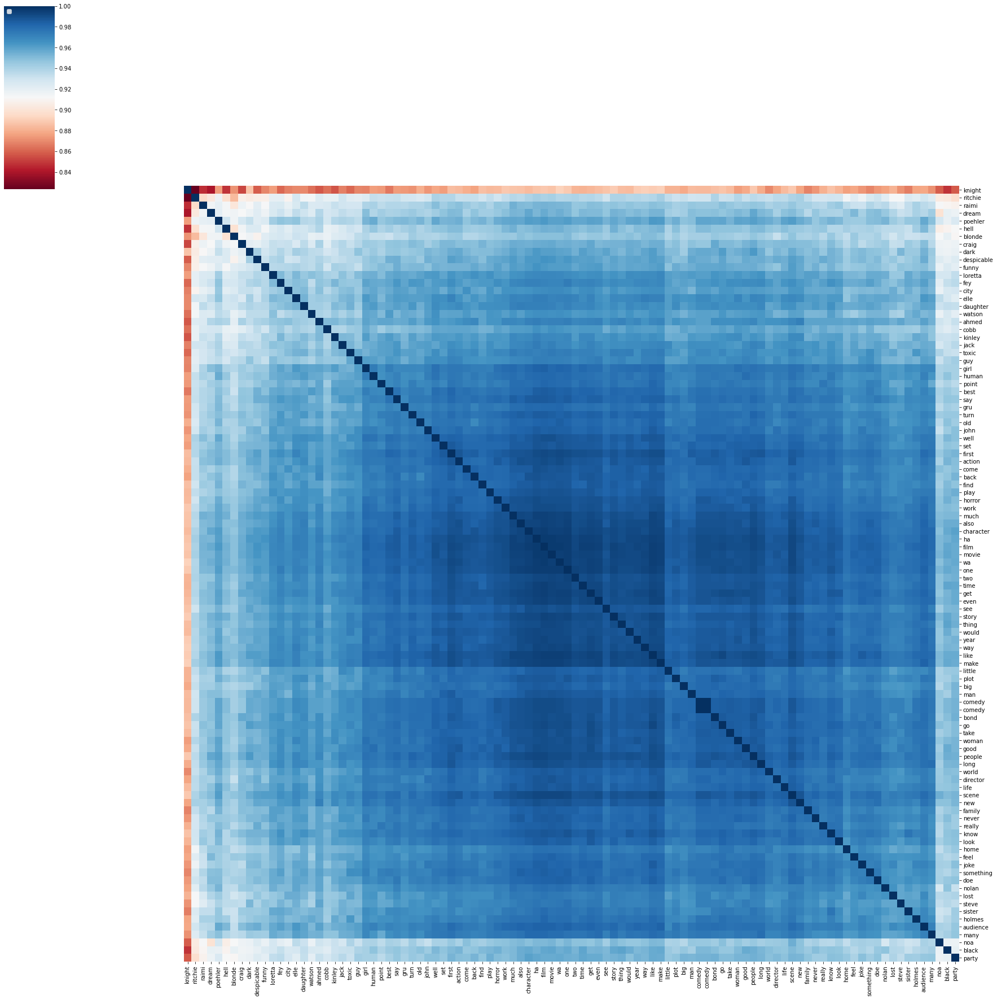

In [57]:
run_word2vec_experiment(tokenized_documents_method_two, 200, chosen_tokens_method_two, 'Word2Vec_Experiment_5')

Word2Vec Experiment 6 - Data Wrangling Method 2 - 300 Embedding Dimensions

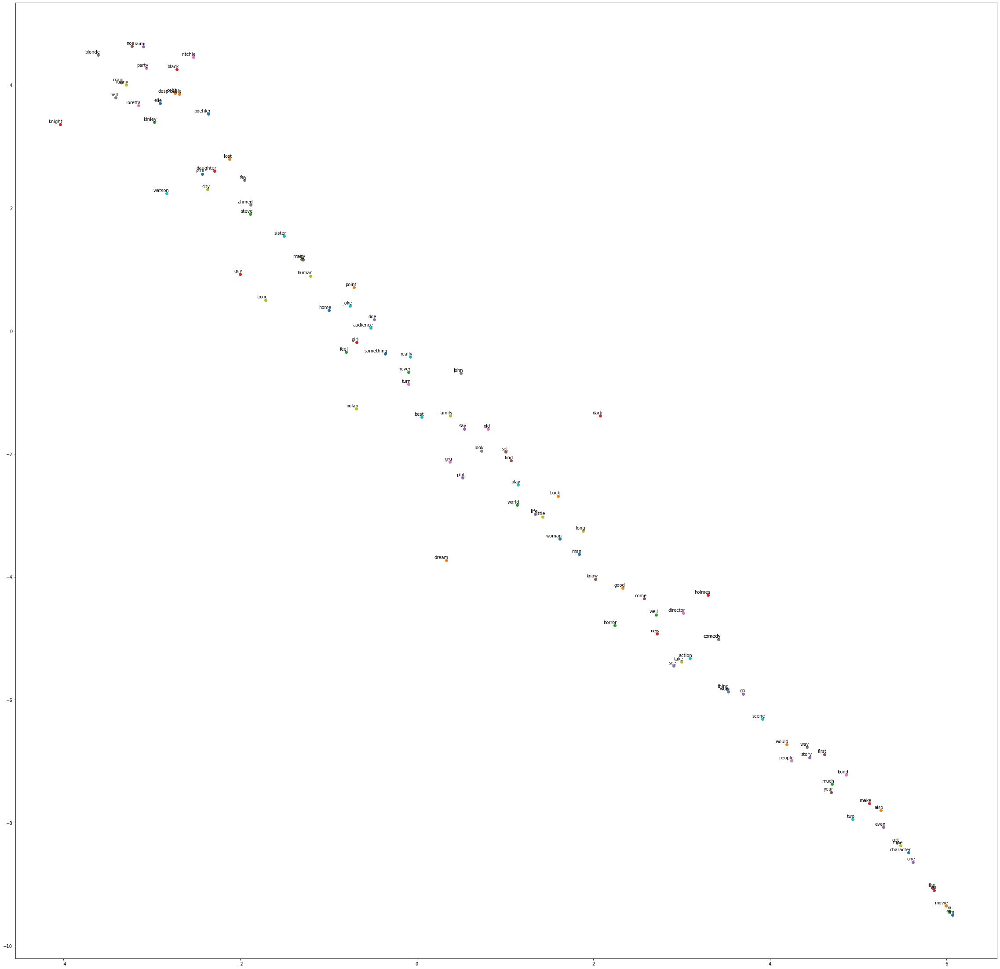

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


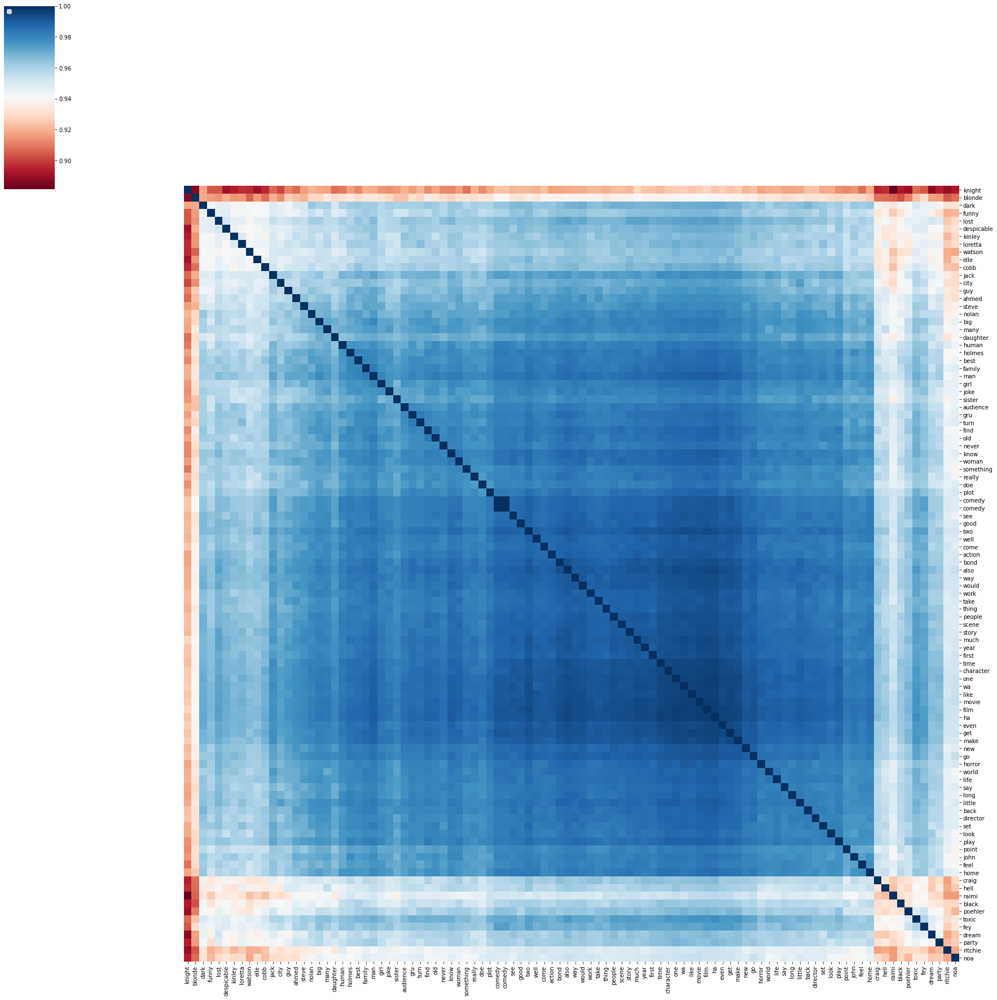

In [58]:
run_word2vec_experiment(tokenized_documents_method_two, 300, chosen_tokens_method_two, 'Word2Vec_Experiment_6')

Word2Vec Experiment 7 - Data Wrangling Method 3 - 100 Embedding Dimensions

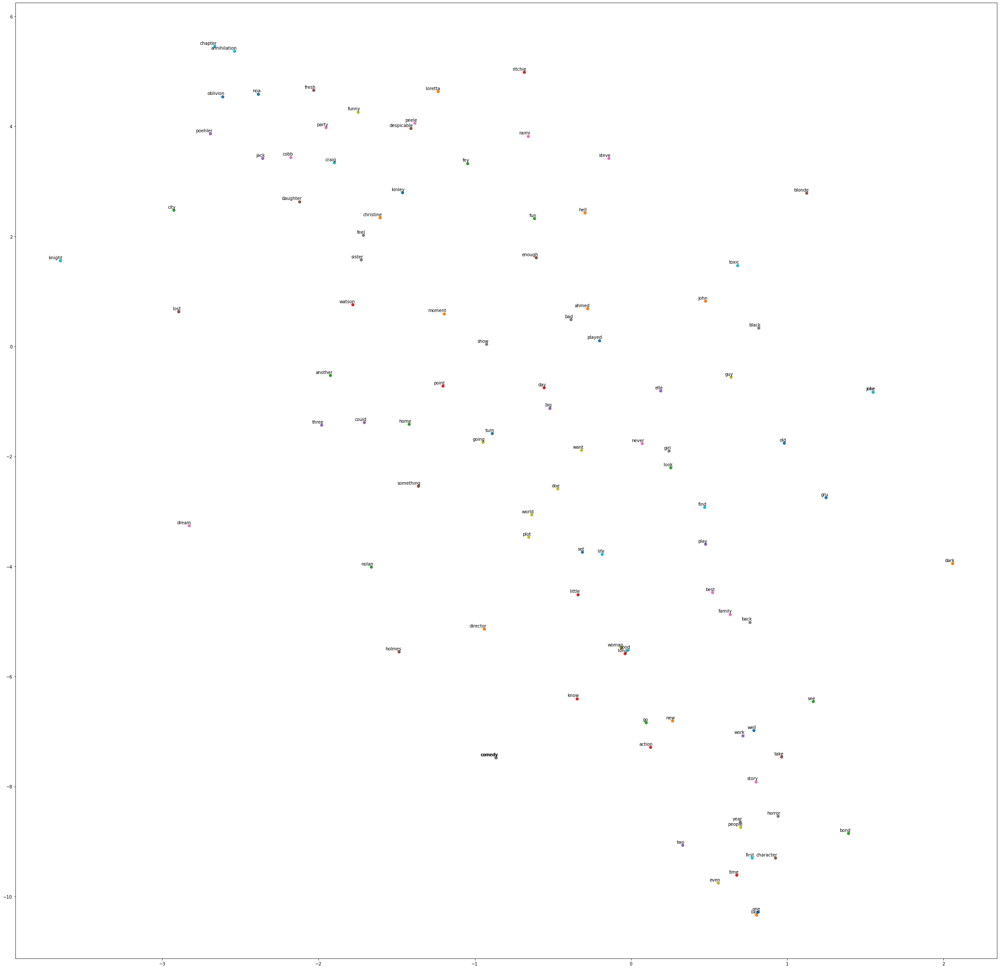

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


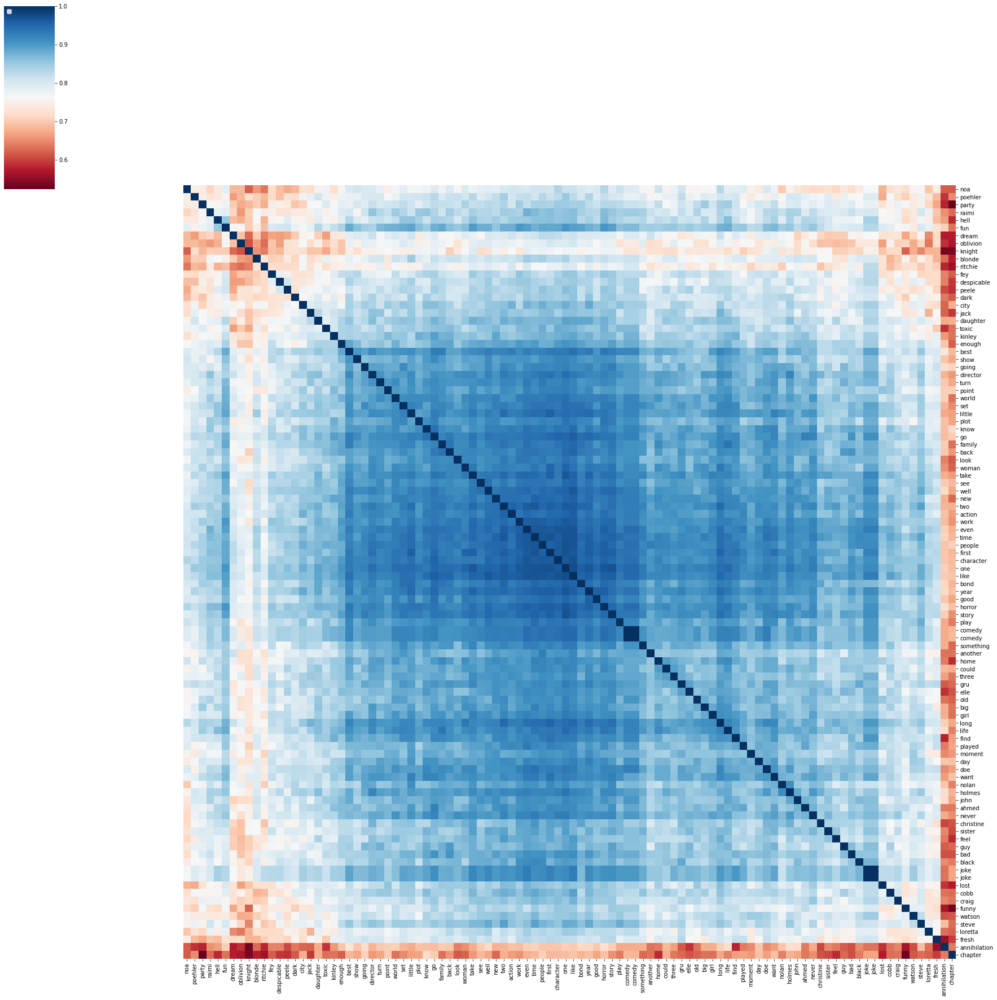

In [59]:
run_word2vec_experiment(tokenized_documents_method_three, 100, chosen_tokens_method_three, 'Word2Vec_Experiment_7')

Word2Vec Experiment 8 - Data Wrangling Method 3 - 200 Embedding Dimensions

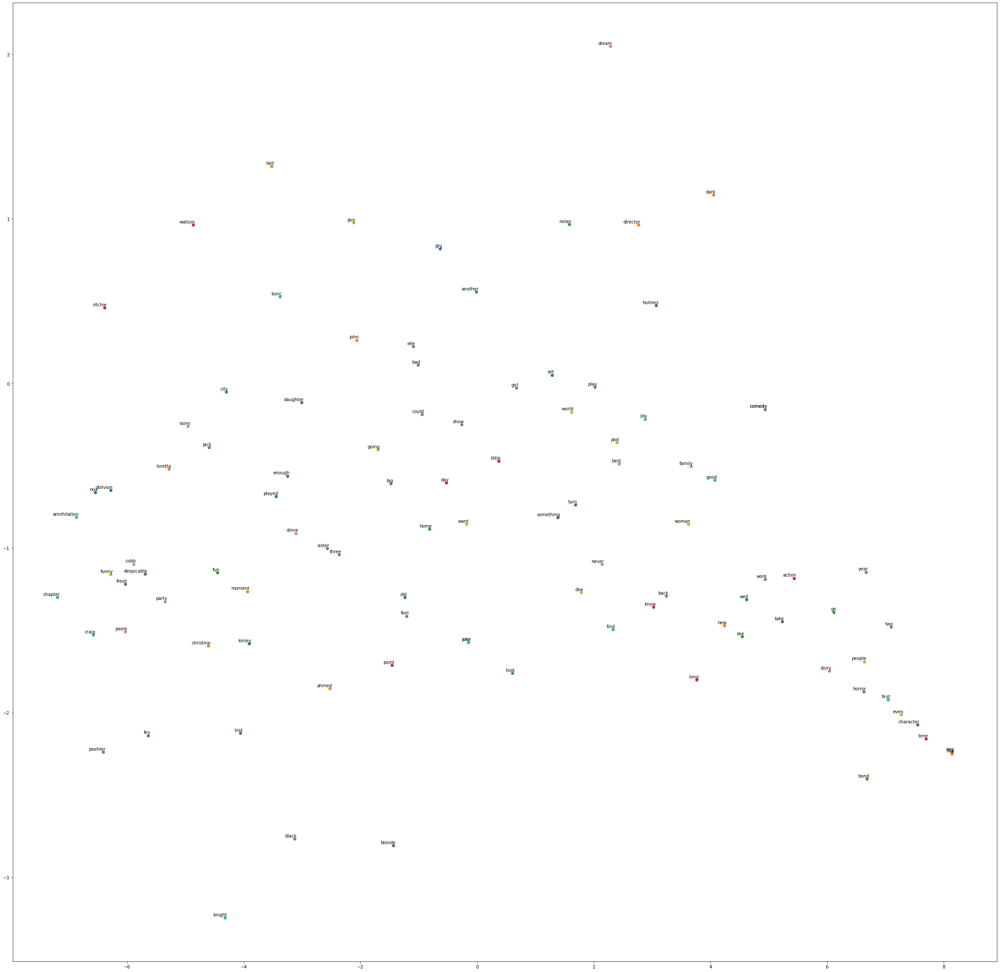

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


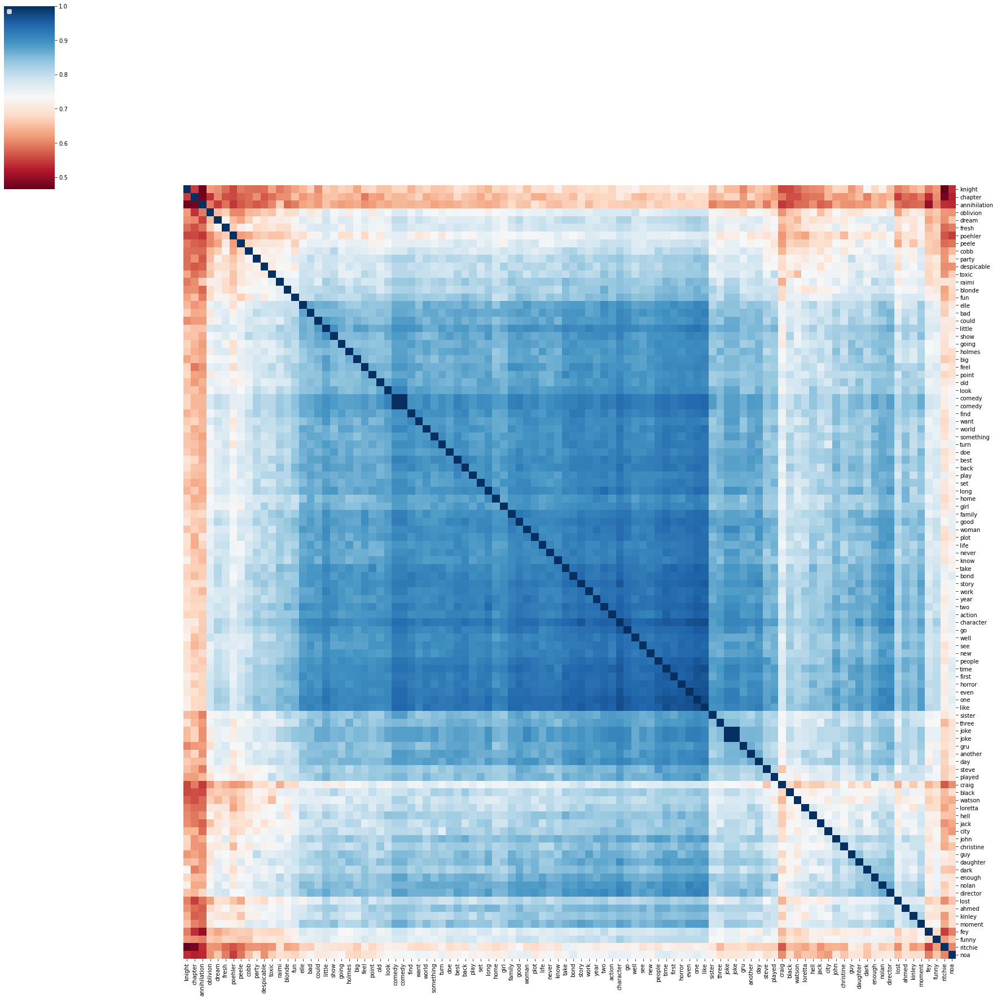

In [60]:
run_word2vec_experiment(tokenized_documents_method_three, 200, chosen_tokens_method_three, 'Word2Vec_Experiment_8')

Word2Vec Experiment 9 - Data Wrangling Method 3 - 300 Embedding Dimensions

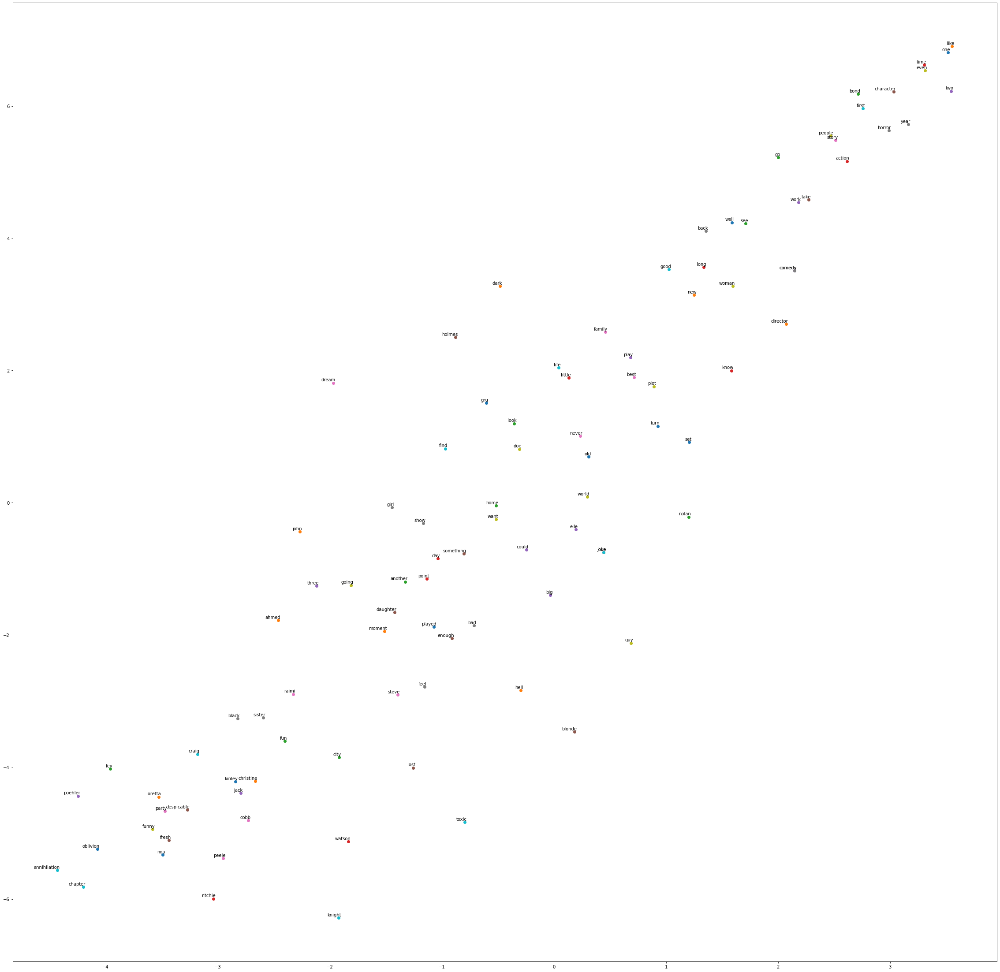

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


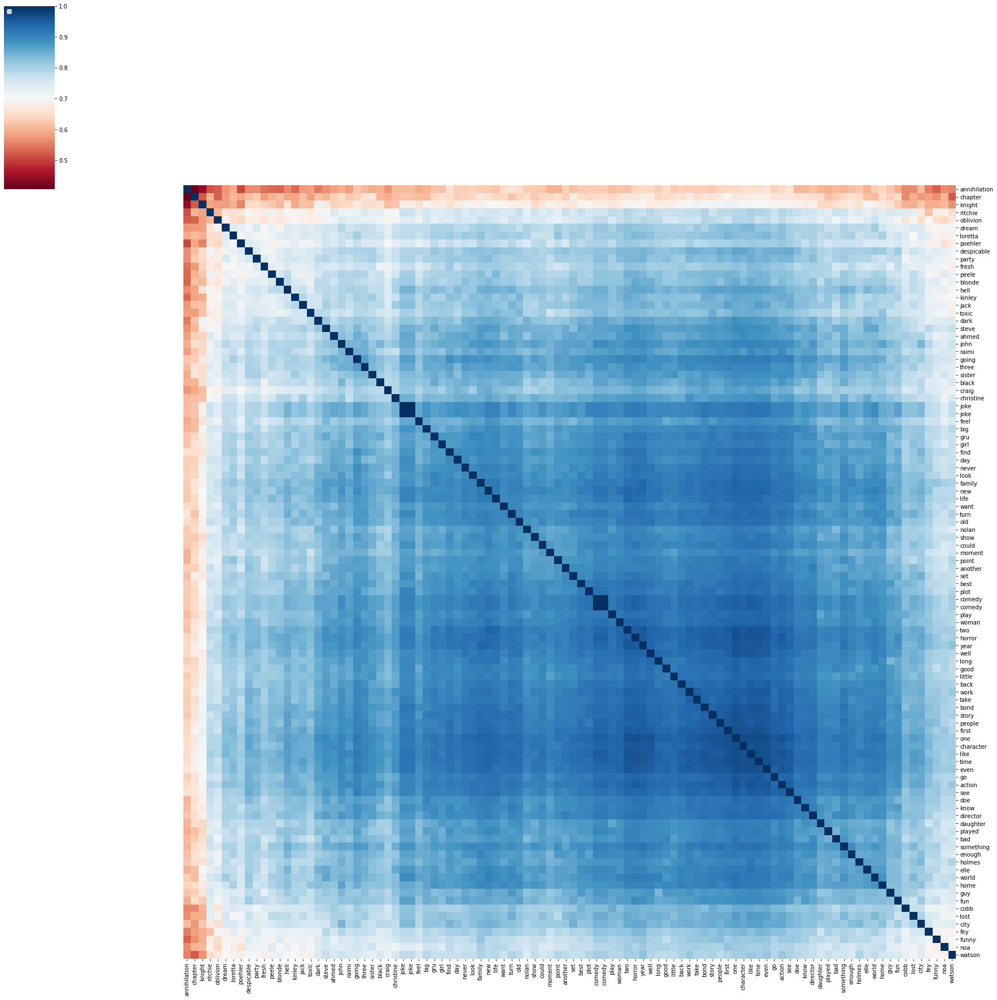

In [61]:
run_word2vec_experiment(tokenized_documents_method_three, 300, chosen_tokens_method_three, 'Word2Vec_Experiment_9')